# Latar Belakang

Dalam dunia transportasi perkotaan, data perjalanan taksi dan limusin adalah sumber informasi yang berharga untuk memahami perilaku penumpang, efisiensi layanan, serta dampak kebijakan dan tarif pada mobilitas kota. Di kota New York, data tersebut dikumpulkan oleh penyedia layanan LPEP dan mencakup berbagai variabel terkait perjalanan seperti tanggal, waktu, lokasi, jumlah penumpang, jarak tempuh, tarif, dan banyak lagi.

Dalam rangka untuk memahami lebih dalam tentang aspek-aspek krusial dari sistem transportasi umum di New York, kita akan melakukan analisis yang tentang dataset ini guna menjadi suatu kebutuhan. Oleh karena itu, pernyataan masalah berikut dirumuskan:

# Pernyataan Masalah

Sebagai seorang data analyst yang sedang menganalisa perusahaan taxi, kita akan mencoba untuk menjawab pertanyaan **bagaimana karakteristik perjalanan taksi dan limusin di New York City dapat dianalisis untuk mendapatkan wawasan yang lebih dalam tentang preferensi penumpang, efektivitas operasional, serta dampak kebijakan tarif dan peraturan transportasi pada sistem transportasi perkotaan?**

# Data

Untuk dapat menjawab pernyataan masalah di atas, kita akan menganalisa data set New York City Taxi and Limousine Commission Trip Record.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
from scipy.stats import normaltest, kstest, chi2_contingency, mannwhitneyu, ttest_ind, shapiro, f_oneway, kruskal

import warnings
# warnings.filterwarnings("ignore")
warnings.filterwarnings("default")

Berikut adalah dataset yang berisikan informasi terkait NYC TLC Trip Record. Terdapat 21 kolom pada dataset ini, yaitu:



|No|Fitur|Deskripsi|
|---|-----|---------|
|1|VendorID| Kode yang menunjukkan penyedia LPEP yang menyediakan catatan. 1 = Creative Mobile Technologies, LLC. & 2 = VeriFone Inc.|
|2|lpep_pickup_datetime|Tanggal dan waktu ketika meter diaktifkan|
|3|lpep_dropoff_datetime|Tanggal dan waktu ketika meter dimatikan.|
|4|store_and_fwd_flag|Ini menunjukkan apakah catatan perjalanan disimpan sementara di dalam memori kendaraan sebelum dikirimkan ke penyedia, yang disebut "store and forward," karena kendaraan tidak memiliki koneksi ke server. Y = perjalanan "store and forward" & N = bukan perjalanan "store and forward"|
|5|RateCodeID|Kode tarif terakhir yang berlaku pada akhir perjalanan. 1 = Tarif standar, 2 = JFK (Bandara John F. Kennedy), 3 = Newark (Bandara Newark), 4 = Nassau atau Westchester, 5 = Tarif yang dinegosiasikan, 6 = Perjalanan kelompok|
|6|PULocationID|Zona taksi TLC di mana taksi meter diaktifkan.|
|7|DOLocationID|Zona taksi TLC di mana taksi meter dimatikan.|
|8|passenger_count|Jumlah penumpang dalam kendaraan. Ini adalah nilai yang dimasukkan oleh pengemudi.|
|9|trip_distance|Jarak perjalanan yang ditempuh dalam mil yang dilaporkan oleh taksi meter.|
|10|fare_amount|Tarif yang dihitung berdasarkan waktu dan jarak oleh taksi meter. Termasuk biaya tambahan dan pungutan tambahan lainnya. Saat ini, ini hanya termasuk biaya jam sibuk dan pungutan tengah malam sebesar $0.50 dan $1.|
|11|extra|Biaya tambahan yang dikenakan pada tarif perjalanan taksi. Biaya ini dapat mencakup biaya tambahan yang berlaku dalam situasi tertentu, seperti jam sibuk atau tarif tengah malam. Nilai dalam kolom ini biasanya dalam satuan dolar dan dapat bervariasi tergantung pada kebijakan perusahaan taksi atau peraturan setempat.|
|12|mta_tax| Pajak MTA sebesar $0.50 yang secara otomatis diaktifkan berdasarkan tarif meter yang digunakan.|
|13|tip_amount|Bagian ini secara otomatis diisi untuk tip kartu kredit. Tip tunai tidak termasuk.|
|14|tolls_amount|Jumlah total tol yang dibayar selama perjalanan.|
|15|ehail_fee |biaya yang terkait dengan penggunaan layanan e-hail (menghail taksi melalui aplikasi ponsel atau platform e-hail). Jika penumpang menggunakan aplikasi atau platform e-hail untuk memesan taksi, maka biaya tambahan ini mungkin dikenakan.|
|16|improvement_surcharge|Pungutan perbaikan sebesar $0.30 - $1.00 yang dikenakan pada perjalanan yang dihail pada awal perjalanan.|
|17|total_amount|Jumlah total yang dibebankan kepada penumpang. Tidak termasuk tip tunai.|
|18|payment_type|Kode numerik yang menunjukkan bagaimana penumpang membayar perjalanan.1 = Kartu kredit, 2 = Tunai, 3 = Tanpa biaya, 4 = Sengketa, 5 = Tidak diketahui, 6 = Perjalanan dibatalkan|
|19|trip_type|Kode yang menunjukkan apakah perjalanan adalah perjalanan dijalankan (dispatch) atau perjalanan yang dihail dari jalan (street-hail), yang secara otomatis ditentukan berdasarkan tarif meter yang digunakan tetapi dapat diubah oleh pengemudi. 1 = Street-hail (diambil dari jalan) & 2 = Dispatch (dijalankan/dispatched)|
|20|congestion_surcharge|biaya tambahan yang dikenakan sebagai pungutan kemacetan. Pada tahun 2019, pemerintah New York mengenakan biaya kemacetan untuk perjalanan taksi dan layanan ride-sharing di wilayah tertentu kota untuk mengurangi kemacetan lalu lintas. Biaya kemacetan ini berlaku dalam jumlah tertentu (biasanya dalam satuan dolar) dan dapat dikenakan pada perjalanan yang melewati wilayah yang berlaku. $2.50 (Yellow Taxi) & $2.75 (Green Taxi)|

Berikut adalah kolom tambahan yang ditambahkan untuk dataset ini, berikut kolom tambahannya:
|No|Fitur|Deskripsi|
|---|-----|---------|
|21|year|Menampilkan tahun yang diambil dari lpep_dropoff_datetime|
|22|duration|Durasi dari tiap perjalanan|
|23|avg_speed|Rata-rata kecepatan mobil (dalam MPH). `trip_distance` dibagi (`duration` / 3600)|
|24|pickup_day|Ekstrak nama hari dari kolom lpep_pickup_datetime|
|25|pickup_hour|Ekstrak jam dari kolom lpep_dropoff_datetime|
|26|dropoff_hour|Ekstrak nama jam dari kolom lpep_dropoff_datetime|
|27|tip_percentage|Persentase `tip_amount` dibagi `total_amount`|
|28|PULocationName|Nama lokasi penjemputan|
|29|DOLocationName|Nama lokasi penurunan|
|30|PU_avg_tip|tip rata-rata pada lokasi penjemputan|
|31|DO_avg_tip|tip rata-rata pada lokasi penurunan|

In [4]:
df = pd.read_csv('NYC TLC Trip Record.csv')
df

C:\Users\ASUS\AppData\Local\Temp\ipykernel_45000\47389403.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('NYC TLC Trip Record.csv')


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.90,1.0,0.5,4.03,0.0,NaN,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.70,1.0,0.5,2.64,0.0,NaN,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.20,1.0,0.5,1.94,0.0,NaN,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.50,0.5,1.5,1.70,0.0,NaN,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.00,0.5,1.5,0.00,0.0,NaN,1.0,8.00,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,NaN,NaN,49,62,NaN,4070.82,15.70,0.0,0.0,0.00,0.0,NaN,1.0,16.70,NaN,NaN,NaN
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,NaN,NaN,10,205,NaN,2.14,4.41,0.0,0.0,0.00,0.0,NaN,1.0,5.41,NaN,NaN,NaN
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,NaN,NaN,66,37,NaN,3.44,16.53,0.0,0.0,3.51,0.0,NaN,1.0,21.04,NaN,NaN,NaN
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,NaN,NaN,225,189,NaN,3.03,14.98,0.0,0.0,3.20,0.0,NaN,1.0,19.18,NaN,NaN,NaN


## **Data Understanding and Cleaning**

Pertama, kita harus memahami dulu datasetnya lebih mendalam melalui tahapan *data understanding*. Dengan melewati proses ini, kita akan mengetahui anomali-anomali yang terdapat di dalam dataset ini yang nantinya akan diproses melalui tahapan *data cleaning*. Setiap anomali akan ditanggapi berdasarkan *case by case scenario* yang akan disertai dengan justifikasi langkah yang diambil berdasarkan *domain knowledge* dan statistik.

Step 1: Cek informasi dari dataset `NYC TLC Trip Record`.

In [5]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (68211, 20)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68211 entries, 0 to 68210
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   VendorID               68211 non-null  int64  
 1   lpep_pickup_datetime   68211 non-null  object 
 2   lpep_dropoff_datetime  68211 non-null  object 
 3   store_and_fwd_flag     63887 non-null  object 
 4   RatecodeID             63887 non-null  float64
 5   PULocationID           68211 non-null  int64  
 6   DOLocationID           68211 non-null  int64  
 7   passenger_count        63887 non-null  float64
 8   trip_distance          68211 non-null  float64
 9   fare_amount            68211 non-null  float64
 10  extra                  68211 non-null  float64
 11  mta_tax                68211 non-null  float64
 12  tip_amount             68211 non-null  float64
 13  tolls_amount           68211 non-null  float64
 14

In [6]:
display(df.describe(), df.describe(include='object'))

,VendorID,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
count,68211.000000,63887.000000,68211.000000,68211.000000,63887.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,0.0,68211.000000,68211.000000,63887.000000,63877.000000,63887.000000
mean,1.863028,1.117160,98.549735,138.429901,1.315870,8.114852,16.603545,0.825431,0.588340,2.139012,0.169627,NaN,0.951625,21.789377,1.373613,1.021933,0.726748
std,0.343820,1.372913,61.244314,76.761311,0.979054,585.105955,13.470121,1.269904,0.385819,3.052710,1.099789,NaN,0.196875,15.457115,0.508039,0.146465,1.212836
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,-70.000000,-2.500000,-0.500000,-10.500000,0.000000,NaN,-1.000000,-71.500000,1.000000,1.000000,-2.750000
25%,2.000000,1.000000,74.000000,74.000000,1.000000,1.110000,9.300000,0.000000,0.500000,0.000000,0.000000,NaN,1.000000,12.900000,1.000000,1.000000,0.000000
50%,2.000000,1.000000,75.000000,138.000000,1.000000,1.850000,13.500000,0.000000,0.500000,1.600000,0.000000,NaN,1.000000,17.900000,1.000000,1.000000,0.000000
75%,2.000000,1.000000,129.000000,219.000000,1.000000,3.210000,19.800000,1.000000,0.500000,3.330000,0.000000,NaN,1.000000,26.150000,2.000000,1.000000,2.750000
max,2.000000,99.000000,265.000000,265.000000,9.000000,120098.840000,490.000000,12.500000,2.750000,222.220000,36.050000,NaN,1.000000,491.000000,5.000000,2.000000,2.750000


,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag
count,68211,68211,63887
unique,66575,66519,2
top,2023-01-09 09:08:00,2023-01-09 00:00:00,N
freq,4,6,63579


In [7]:
pd.set_option('display.max_colwidth', None)
# data unique di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,VendorID,2,"[2, 1]"
1,lpep_pickup_datetime,66575,"[2023-01-01 00:26:10, 2023-01-01 00:51:03, 2023-01-01 00:35:12, 2023-01-01 00:13:14, 2023-01-01 00:33:04, 2023-01-01 00:53:31, 2023-01-01 00:09:14, 2023-01-01 00:11:58, 2023-01-01 00:41:29, 2023-01-01 00:50:32, 2023-01-01 00:16:12, 2023-01-01 00:08:43, 2023-01-01 00:26:32, 2023-01-01 00:18:35, 2023-01-01 00:39:32, 2023-01-01 00:49:34, 2023-01-01 00:10:45, 2023-01-01 00:35:11, 2023-01-01 00:31:06, 2023-01-01 00:14:37, 2023-01-01 00:26:21, 2023-01-01 00:41:56, 2023-01-01 00:32:02, 2023-01-01 00:55:13, 2023-01-01 00:01:31, 2023-01-01 00:22:31, 2023-01-01 00:57:28, 2023-01-01 00:35:21, 2023-01-01 00:52:52, 2023-01-01 00:32:56, 2023-01-01 00:24:01, 2023-01-01 00:46:48, 2023-01-01 00:40:58, 2023-01-01 00:20:23, 2023-01-01 01:49:24, 2023-01-01 00:41:53, 2023-01-01 00:56:26, 2023-01-01 00:33:10, 2023-01-01 00:58:28, 2023-01-01 00:42:49, 2023-01-01 00:48:21, 2023-01-01 00:08:05, 2023-01-01 00:13:47, 2023-01-01 00:16:10, 2023-01-01 00:04:25, 2023-01-01 00:33:38, 2023-01-01 00:46:08, 2023-01-01 01:00:08, 2023-01-01 00:28:04, 2023-01-01 00:23:04, 2023-01-01 00:34:07, 2023-01-01 00:52:03, 2023-01-01 00:25:31, 2023-01-01 00:53:09, 2023-01-01 00:42:37, 2023-01-01 00:39:52, 2023-01-01 00:15:32, 2023-01-01 00:06:48, 2023-01-01 00:57:15, 2023-01-01 00:14:13, 2023-01-01 00:52:48, 2023-01-01 00:34:13, 2023-01-01 00:44:41, 2023-01-01 00:11:12, 2023-01-01 01:44:43, 2023-01-01 01:04:44, 2023-01-01 01:48:11, 2023-01-01 01:11:39, 2023-01-01 01:54:25, 2023-01-01 01:59:10, 2023-01-01 01:22:35, 2023-01-01 01:37:10, 2023-01-01 01:46:22, 2023-01-01 01:59:48, 2023-01-01 01:09:49, 2023-01-01 01:23:35, 2023-01-01 01:53:20, 2023-01-01 01:32:14, 2023-01-01 01:01:05, 2023-01-01 01:34:41, 2023-01-01 01:52:08, 2023-01-01 01:49:28, 2023-01-01 01:03:59, 2023-01-01 01:13:11, 2023-01-01 01:40:06, 2023-01-01 01:33:50, 2023-01-01 01:45:19, 2023-01-01 01:51:29, 2023-01-01 01:34:07, 2023-01-01 01:10:08, 2023-01-01 01:32:17, 2023-01-01 01:48:28, 2023-01-01 01:30:43, 2023-01-01 01:51:10, 2023-01-01 01:09:36, 2023-01-01 01:19:54, 2023-01-01 01:31:10, 2023-01-01 01:42:30, 2023-01-01 00:57:51, 2023-01-01 01:27:36, ...]"
2,lpep_dropoff_datetime,66519,"[2023-01-01 00:37:11, 2023-01-01 00:57:49, 2023-01-01 00:41:32, 2023-01-01 00:19:03, 2023-01-01 00:39:02, 2023-01-01 01:11:04, 2023-01-01 00:26:39, 2023-01-01 00:24:55, 2023-01-01 00:46:26, 2023-01-01 01:13:42, 2023-01-01 00:41:43, 2023-01-01 00:17:08, 2023-01-01 00:45:31, 2023-01-01 00:30:09, 2023-01-01 01:18:06, 2023-01-01 01:08:23, 2023-01-01 00:19:37, 2023-01-01 01:17:35, 2023-01-01 00:42:23, 2023-01-01 00:21:50, 2023-01-01 00:30:26, 2023-01-01 00:46:06, 2023-01-01 00:41:25, 2023-01-01 00:59:47, 2023-01-01 00:16:02, 2023-01-01 00:39:24, 2023-01-01 01:09:31, 2023-01-01 00:53:49, 2023-01-01 01:00:53, 2023-01-01 00:42:53, 2023-01-01 00:32:05, 2023-01-01 01:08:17, 2023-01-01 01:04:32, 2023-01-01 00:24:32, 2023-01-01 01:57:51, 2023-01-01 00:41:58, 2023-01-01 01:14:41, 2023-01-01 00:43:08, 2023-01-01 01:14:46, 2023-01-01 00:51:53, 2023-01-01 01:23:50, 2023-01-01 00:13:26, 2023-01-01 00:25:57, 2023-01-01 00:54:55, 2023-01-01 00:17:50, 2023-01-01 00:38:51, 2023-01-01 00:59:10, 2023-01-01 01:05:46, 2023-01-01 00:43:45, 2023-01-01 23:18:32, 2023-01-01 00:50:01, 2023-01-01 00:57:56, 2023-01-01 00:38:40, 2023-01-01 01:13:35, 2023-01-01 00:47:15, 2023-01-01 00:48:54, 2023-01-01 00:23:03, 2023-01-01 01:08:47, 2023-01-01 01:00:15, 2023-01-01 00:25:43, 2023-01-01 01:21:19, 2023-01-01 00:43:57, 2023-01-01 00:48:26, 2023-01-01 00:38:12, 2023-01-01 01:57:31, 2023-01-01 01:11:23, 2023-01-01 02:05:51, 2023-01-01 01:41:21, 2023-01-01 02:05:19, 2023-01-01 02:11:36, 2023-01-01 01:25:11, 2023-01-01 01:41:30, 2023-01-01 02:04:14, 2023-01-01 02:05:29, 2023-01-01 01:17:55, 2023-01-01 01:53:43, 2023-01-01 02:27:01, 2023-01-01 01:43:55, 2023-01-01 01:13:02, 2023-01-01 02:00:06, 2023-01-01 02:00:57, 2023-01-01 02:13:18, 2023-01-01 01:07:17, 2023-01-01 01:26:01, 2

In [8]:
# mencari tahu total NaN (Missing Value) di tiap kolom
df.isna().sum()

VendorID                     0
lpep_pickup_datetime         0
lpep_dropoff_datetime        0
store_and_fwd_flag        4324
RatecodeID                4324
PULocationID                 0
DOLocationID                 0
passenger_count           4324
trip_distance                0
fare_amount                  0
extra                        0
mta_tax                      0
tip_amount                   0
tolls_amount                 0
ehail_fee                68211
improvement_surcharge        0
total_amount                 0
payment_type              4324
trip_type                 4334
congestion_surcharge      4324
dtype: int64

Dari data di atas, dapat dilihat sebagai berikut:
- Dataset NYC TLC Trip Record memiliki 20 kolom dan 68211 baris
- Berikut adalah kolom yang memiliki missing value: `store_and_fwd_flag`, `RatecodeID`, `passenger_count`, `ehail_fee`, `payment_type`, `trip_type`, dan `congestion_surcharge`. Data kosong pada kolom tersebut diwakilkan dengan nilai `NaN`
- `ehail_fee` memiliki NaN di setiap barisnya, sehingga kolom ini akan dihapus.
- Kolom `lpep_pickup_datetime` dan `lpep_dropoff_datetime` memiliki tipe data object sehingga kolom ini mungkin harus dikonversi ke tipe data datetime untuk memungkinkan manipulasi waktu dan tanggal yang tepat. (object -> datetime64)
- Kolom `store_and_fwd_flag` memiliki tipe data object sehingga kolom ini mungkin harus diubah menjadi tipe data boolean (True/False) jika nilainya hanya berisi "Y" atau "N". Jika ada nilai lain yang mungkin muncul, perlu diperiksa lebih lanjut. (object -> boolean)
- Kolom `RatecodeID`, `passenger_count`, `payment_type`, dan `trip_type` memiliki tipe data float64 sehingga Kolom-kolom ini mungkin harus dikonversi menjadi tipe data yang sesuai dengan jenis datanya, yaitu: integer. (float64 -> int64)
- Kolom `RatecodeID` terdiri dari pilihan angka 1-6, tetapi ada angka 99.0 dan tidak ada angka 6 di kolom tersebut. Oleh karena itu angka 99.0 di data ini akan diubah menjadi 6.
- Kolom `payment_type` terdiri dari pilihan angka 1-6, tetapi ada missing value dan tidak ada no 6. Maka untuk pengisian kolom ini akan diteliti lebih lanjut.
- Ada data 0.0 pada kolom `passenger_count`, hal ini tidak mungkin terjadi karena minimal pasti ada 1 penumpang. Maka kita akan meneliti lebih lanjut untuk mengetahui langkah apa yang akan dilakukan untuk kolom tersebut.
- Ada beberapa nilai negatif pada kolom `extra`, `mta_tax`, `improvement_surcharge`, dan `congestion_surcharge`. Data ini mungkin valid tergantung pada konteksnya. Dalam kasus ini, beberapa kolom tersebut tampaknya mencantumkan biaya tambahan atau pungutan yang mungkin memiliki nilai negatif atau positif. Contohnya, beberapa kolom tersebut mungkin mencantumkan potongan atau pengembalian uang kepada penumpang.

In [9]:
# # Melakukan konversi untuk beberapa tipe data yang mungkin perlu diubah agar sesuai dengan kontennya.
# # Di bawah ini adalah beberapa kolom yang mungkin perlu dikonversi:

# # Mengkonversi menjadi datetime
# df['lpep_pickup_datetime'] = pd.to_datetime(df['lpep_pickup_datetime'])
# df['lpep_dropoff_datetime'] = pd.to_datetime(df['lpep_dropoff_datetime'])

# # Mengkonversi menjadi integer
# df['RatecodeID'] = df['RatecodeID'].astype(int)
# df['passenger_count'] = df['passenger_count'].astype(int)
# df['payment_type'] = df['payment_type'].astype(int)
# df['trip_type'] = df['trip_type'].astype(int)


### Missing Value

In [10]:
# Jumlah missing value di tiap kolom
df.isna().sum()

VendorID                     0
lpep_pickup_datetime         0
lpep_dropoff_datetime        0
store_and_fwd_flag        4324
RatecodeID                4324
PULocationID                 0
DOLocationID                 0
passenger_count           4324
trip_distance                0
fare_amount                  0
extra                        0
mta_tax                      0
tip_amount                   0
tolls_amount                 0
ehail_fee                68211
improvement_surcharge        0
total_amount                 0
payment_type              4324
trip_type                 4334
congestion_surcharge      4324
dtype: int64

In [11]:
# Persentase missing value di tiap kolom
df.isna().sum()/df.shape[0]*100

VendorID                   0.000000
lpep_pickup_datetime       0.000000
lpep_dropoff_datetime      0.000000
store_and_fwd_flag         6.339154
RatecodeID                 6.339154
PULocationID               0.000000
DOLocationID               0.000000
passenger_count            6.339154
trip_distance              0.000000
fare_amount                0.000000
extra                      0.000000
mta_tax                    0.000000
tip_amount                 0.000000
tolls_amount               0.000000
ehail_fee                100.000000
improvement_surcharge      0.000000
total_amount               0.000000
payment_type               6.339154
trip_type                  6.353814
congestion_surcharge       6.339154
dtype: float64

In [12]:
# Menghapus kolom ehail_fee
df = df.drop(columns='ehail_fee')
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.90,1.0,0.5,4.03,0.0,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.70,1.0,0.5,2.64,0.0,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.20,1.0,0.5,1.94,0.0,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.50,0.5,1.5,1.70,0.0,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.00,0.5,1.5,0.00,0.0,1.0,8.00,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,NaN,NaN,49,62,NaN,4070.82,15.70,0.0,0.0,0.00,0.0,1.0,16.70,NaN,NaN,NaN
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,NaN,NaN,10,205,NaN,2.14,4.41,0.0,0.0,0.00,0.0,1.0,5.41,NaN,NaN,NaN
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,NaN,NaN,66,37,NaN,3.44,16.53,0.0,0.0,3.51,0.0,1.0,21.04,NaN,NaN,NaN
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,NaN,NaN,225,189,NaN,3.03,14.98,0.0,0.0,3.20,0.0,1.0,19.18,NaN,NaN,NaN


<Axes: >

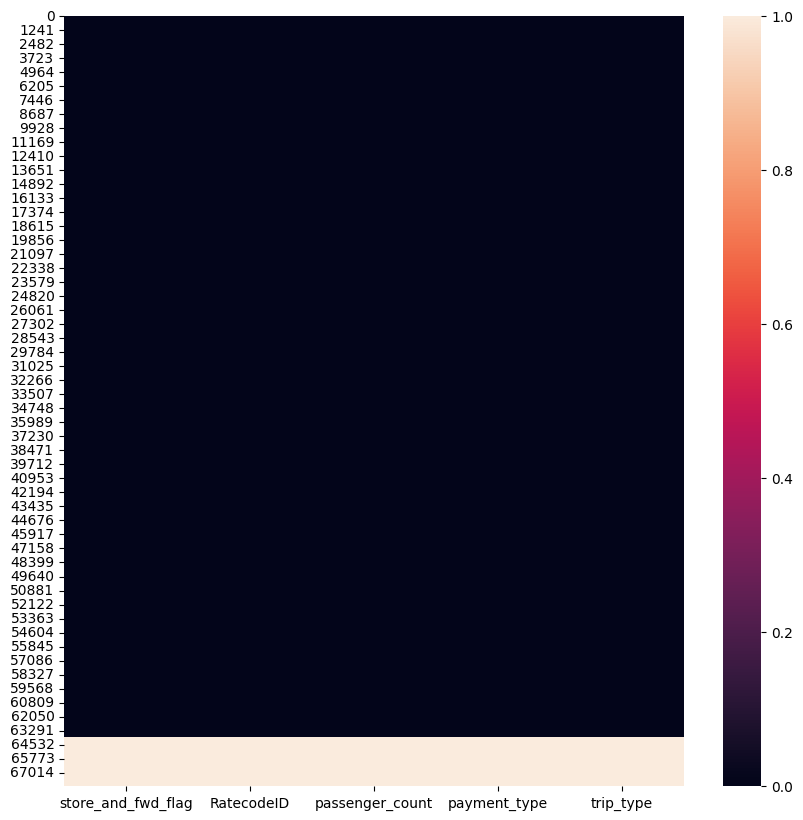

In [13]:
# Sebaran missing value di dalam data
plt.figure(figsize=(10,10))
sns.heatmap(df[['store_and_fwd_flag','RatecodeID','passenger_count','payment_type','trip_type']].isna())

Secara umum, kita dapat mengidentifikasi beberapa hal penting terkait missing value dalam dataset:

- Missing value yang ditemukan di `store_and_fwd_flag`, `RatecodeID`, `passenger_count`, `payment_type`, dan `congestion_surcharge` memiliki persentase *missing value* yang moderat (<10%) sebesar 6.34%. Sedangkan `trip_type` memiliki missing value sebesar 6.35%.

- Terdapat keterkaitan *missing value* yang terlihat antara `store_and_fwd_flag, RatecodeID`, `passenger_count`, `payment_type`, `trip_type` dan `congestion_surcharge` di mana ketika data pada kolom `store_and_fwd_flag` kosong, kemungkinan besar data pada kolom-kolom lainya juga kosong.

Terdapat dua metode umum untuk mengatasi missing value:

- Penghapusan Data: Metode pertama melibatkan penghapusan baris atau kolom yang mengandung *missing value*. Namun, dalam kasus ini, jumlah *missing value*nya moderat (hingga 6.35%), sehingga opsi ini sebenarnya bisa saja dilakukan. Tapi dikarenakan kita dapat mengisi *missing value* dengan data yang relevan atau benar, maka kita tidak akan menghapusnya.

- Imputasi Data: Metode kedua lebih disarankan. Dalam pendekatan ini, kita mencoba mengisi missing value dengan data yang sesuai atau relevan berdasarkan pengetahuan domain atau dengan metode statistik. Idealnya, kita akan mencoba untuk menggantikan missing value dengan nilai yang sesuai berdasarkan pengetahuan domain atau dengan menggunakan data yang tersedia. Jika tidak ada opsi yang memadai, kita dapat mempertimbangkan untuk mengisi missing value dengan nilai rerata (mean), median, atau modus, sebagai opsi terakhir setelah mencoba alternatif yang lebih baik.

- Menggunakan metode imputasi data ini, kita dapat menjaga integritas data dan menghindari kehilangan informasi yang berharga. Selalu penting untuk mengevaluasi setiap kolom secara individu dan mempertimbangkan pendekatan yang paling sesuai dengan konteks dataset dan tujuan analisis.

Setelah melakukan tinjauan awal terhadap anomali dalam data, sekarang saatnya untuk melakukan analisis dan penanganan yang lebih mendalam terhadap setiap anomali yang ada.

Sebelum meninjau anomali dan mengisi *missing value* dalam data, kita akan mengecek validitas *unique sample* setiap kolom terlebih dahulu.
<br>
- `VendorID`: data sudah benar
- `lpep_pickup_datetime`: data sudah benar
- `lpep_dropoff_datetime`: data sudah benar
- `store_and_fwd_flag`: ada NaN
- `RatecodeID`: ada nilai 99.0 dan Nan
- `PULocationID`: data sudah benar
- `DOLocationID`: data sudah benar
- `passenger_count`: ada nilai 0 dan Nan
- `trip_distance`: ada nilai 0
- `fare_amount`: ada nilai minus dan 0
- `extra`: ada nilai minus
- `mta_tax`: ada nilai minus dan berdasarkan penjelasannya, nilai mta_tax seharusnya tidak ada yang lebih besar dari 0.5 (anomali)
- `tip_amount`: ada nilai minus
- `tolls_amount`: data sudah benar
- `ehail_fee`: hapus kolom
- `improvement_surcharge`: ada nilai minus
- `total_amount`: ada minus
- `payment_type`: ada NaN
- `trip_type`: ada NaN
- `congestion_surcharge`: ada nilai minus

**Mengubah nilai minus menjadi positif (absolut)**

Kolom `fare_amount`, `extra`, `mta_tax`, `tip_amount`, `improvement_surcharge`, `total_amount`, `congestion_surcharge` memiliki nilai minus. Apabila kita mengacu kepada informasi pada dataset, kolom-kolom tersebut tidak seharusnya memiliki nilai 0. Oleh karena itu kita akan mengubah nilai minusnya menjadi positif.

In [14]:
# Daftar kolom yang akan diubah menjadi positif nilainya
kolom_yang_diubah = ['fare_amount', 'extra', 'mta_tax', 
                'tip_amount', 'improvement_surcharge', 'total_amount', 
                'congestion_surcharge']

# Loop untuk mengubah nilai minus menjadi positif pada kolom yang dipilih
for kolom in kolom_yang_diubah:
    df[kolom] = df[kolom].apply(abs)

In [15]:
pd.set_option('display.max_colwidth', None)
# data unique di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,VendorID,2,"[2, 1]"
1,lpep_pickup_datetime,66575,"[2023-01-01 00:26:10, 2023-01-01 00:51:03, 2023-01-01 00:35:12, 2023-01-01 00:13:14, 2023-01-01 00:33:04, 2023-01-01 00:53:31, 2023-01-01 00:09:14, 2023-01-01 00:11:58, 2023-01-01 00:41:29, 2023-01-01 00:50:32, 2023-01-01 00:16:12, 2023-01-01 00:08:43, 2023-01-01 00:26:32, 2023-01-01 00:18:35, 2023-01-01 00:39:32, 2023-01-01 00:49:34, 2023-01-01 00:10:45, 2023-01-01 00:35:11, 2023-01-01 00:31:06, 2023-01-01 00:14:37, 2023-01-01 00:26:21, 2023-01-01 00:41:56, 2023-01-01 00:32:02, 2023-01-01 00:55:13, 2023-01-01 00:01:31, 2023-01-01 00:22:31, 2023-01-01 00:57:28, 2023-01-01 00:35:21, 2023-01-01 00:52:52, 2023-01-01 00:32:56, 2023-01-01 00:24:01, 2023-01-01 00:46:48, 2023-01-01 00:40:58, 2023-01-01 00:20:23, 2023-01-01 01:49:24, 2023-01-01 00:41:53, 2023-01-01 00:56:26, 2023-01-01 00:33:10, 2023-01-01 00:58:28, 2023-01-01 00:42:49, 2023-01-01 00:48:21, 2023-01-01 00:08:05, 2023-01-01 00:13:47, 2023-01-01 00:16:10, 2023-01-01 00:04:25, 2023-01-01 00:33:38, 2023-01-01 00:46:08, 2023-01-01 01:00:08, 2023-01-01 00:28:04, 2023-01-01 00:23:04, 2023-01-01 00:34:07, 2023-01-01 00:52:03, 2023-01-01 00:25:31, 2023-01-01 00:53:09, 2023-01-01 00:42:37, 2023-01-01 00:39:52, 2023-01-01 00:15:32, 2023-01-01 00:06:48, 2023-01-01 00:57:15, 2023-01-01 00:14:13, 2023-01-01 00:52:48, 2023-01-01 00:34:13, 2023-01-01 00:44:41, 2023-01-01 00:11:12, 2023-01-01 01:44:43, 2023-01-01 01:04:44, 2023-01-01 01:48:11, 2023-01-01 01:11:39, 2023-01-01 01:54:25, 2023-01-01 01:59:10, 2023-01-01 01:22:35, 2023-01-01 01:37:10, 2023-01-01 01:46:22, 2023-01-01 01:59:48, 2023-01-01 01:09:49, 2023-01-01 01:23:35, 2023-01-01 01:53:20, 2023-01-01 01:32:14, 2023-01-01 01:01:05, 2023-01-01 01:34:41, 2023-01-01 01:52:08, 2023-01-01 01:49:28, 2023-01-01 01:03:59, 2023-01-01 01:13:11, 2023-01-01 01:40:06, 2023-01-01 01:33:50, 2023-01-01 01:45:19, 2023-01-01 01:51:29, 2023-01-01 01:34:07, 2023-01-01 01:10:08, 2023-01-01 01:32:17, 2023-01-01 01:48:28, 2023-01-01 01:30:43, 2023-01-01 01:51:10, 2023-01-01 01:09:36, 2023-01-01 01:19:54, 2023-01-01 01:31:10, 2023-01-01 01:42:30, 2023-01-01 00:57:51, 2023-01-01 01:27:36, ...]"
2,lpep_dropoff_datetime,66519,"[2023-01-01 00:37:11, 2023-01-01 00:57:49, 2023-01-01 00:41:32, 2023-01-01 00:19:03, 2023-01-01 00:39:02, 2023-01-01 01:11:04, 2023-01-01 00:26:39, 2023-01-01 00:24:55, 2023-01-01 00:46:26, 2023-01-01 01:13:42, 2023-01-01 00:41:43, 2023-01-01 00:17:08, 2023-01-01 00:45:31, 2023-01-01 00:30:09, 2023-01-01 01:18:06, 2023-01-01 01:08:23, 2023-01-01 00:19:37, 2023-01-01 01:17:35, 2023-01-01 00:42:23, 2023-01-01 00:21:50, 2023-01-01 00:30:26, 2023-01-01 00:46:06, 2023-01-01 00:41:25, 2023-01-01 00:59:47, 2023-01-01 00:16:02, 2023-01-01 00:39:24, 2023-01-01 01:09:31, 2023-01-01 00:53:49, 2023-01-01 01:00:53, 2023-01-01 00:42:53, 2023-01-01 00:32:05, 2023-01-01 01:08:17, 2023-01-01 01:04:32, 2023-01-01 00:24:32, 2023-01-01 01:57:51, 2023-01-01 00:41:58, 2023-01-01 01:14:41, 2023-01-01 00:43:08, 2023-01-01 01:14:46, 2023-01-01 00:51:53, 2023-01-01 01:23:50, 2023-01-01 00:13:26, 2023-01-01 00:25:57, 2023-01-01 00:54:55, 2023-01-01 00:17:50, 2023-01-01 00:38:51, 2023-01-01 00:59:10, 2023-01-01 01:05:46, 2023-01-01 00:43:45, 2023-01-01 23:18:32, 2023-01-01 00:50:01, 2023-01-01 00:57:56, 2023-01-01 00:38:40, 2023-01-01 01:13:35, 2023-01-01 00:47:15, 2023-01-01 00:48:54, 2023-01-01 00:23:03, 2023-01-01 01:08:47, 2023-01-01 01:00:15, 2023-01-01 00:25:43, 2023-01-01 01:21:19, 2023-01-01 00:43:57, 2023-01-01 00:48:26, 2023-01-01 00:38:12, 2023-01-01 01:57:31, 2023-01-01 01:11:23, 2023-01-01 02:05:51, 2023-01-01 01:41:21, 2023-01-01 02:05:19, 2023-01-01 02:11:36, 2023-01-01 01:25:11, 2023-01-01 01:41:30, 2023-01-01 02:04:14, 2023-01-01 02:05:29, 2023-01-01 01:17:55, 2023-01-01 01:53:43, 2023-01-01 02:27:01, 2023-01-01 01:43:55, 2023-01-01 01:13:02, 2023-01-01 02:00:06, 2023-01-01 02:00:57, 2023-01-01 02:13:18, 2023-01-01 01:07:17, 2023-01-01 01:26:01, 2

#### `store_and_fwd_flag`, `RatecodeID`, `passenger_count`, `payment_type`, `trip_type`, dan `congestion_surcharge`

In [16]:
# Untuk mengecek apakah NaN berada di baris yang sama 
# pada kolom store_and_fwd_flag, RatecodeID, passenger_count, payment_type, trip_type, dan _congestion_surcharge
df[(df['store_and_fwd_flag'].isna()) & (df['RatecodeID'].isna()) & (df['passenger_count'].isna()) & (df['payment_type'].isna()) & (df['trip_type'].isna()) & (df['congestion_surcharge'].isna())]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
63887,2,2023-01-01 00:28:00,2023-01-01 00:54:00,NaN,NaN,7,17,NaN,9.33,36.03,0.0,0.0,7.41,0.0,1.0,44.44,NaN,NaN,NaN
63888,2,2023-01-01 00:39:00,2023-01-01 00:52:00,NaN,NaN,37,37,NaN,2.67,14.55,0.0,0.0,3.11,0.0,1.0,18.66,NaN,NaN,NaN
63889,2,2023-01-01 00:58:00,2023-01-01 01:21:00,NaN,NaN,80,7,NaN,7.39,32.13,0.0,0.0,6.63,0.0,1.0,39.76,NaN,NaN,NaN
63890,2,2023-01-01 00:35:00,2023-01-01 00:55:00,NaN,NaN,169,42,NaN,4.04,17.85,0.0,0.0,0.00,0.0,1.0,18.85,NaN,NaN,NaN
63891,2,2023-01-01 00:45:00,2023-01-01 00:55:00,NaN,NaN,42,262,NaN,3.86,19.67,0.0,0.0,4.68,0.0,1.0,28.10,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,NaN,NaN,49,62,NaN,4070.82,15.70,0.0,0.0,0.00,0.0,1.0,16.70,NaN,NaN,NaN
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,NaN,NaN,10,205,NaN,2.14,4.41,0.0,0.0,0.00,0.0,1.0,5.41,NaN,NaN,NaN
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,NaN,NaN,66,37,NaN,3.44,16.53,0.0,0.0,3.51,0.0,1.0,21.04,NaN,NaN,NaN
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,NaN,NaN,225,189,NaN,3.03,14.98,0.0,0.0,3.20,0.0,1.0,19.18,NaN,NaN,NaN


In [17]:
# Untuk mengecek trip_type yang kosong (10 baris)
df[(~df['store_and_fwd_flag'].isna()) & (~df['RatecodeID'].isna()) & (~df['passenger_count'].isna()) & (~df['payment_type'].isna()) & (~df['congestion_surcharge'].isna()) & (df['trip_type'].isna())]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
1084,1,2023-01-01 19:44:13,2023-01-01 19:58:30,N,99.0,150,55,1.0,3.3,18.2,0.0,1.5,0.0,0.0,1.0,19.7,1.0,NaN,0.0
2174,1,2023-01-02 16:39:05,2023-01-02 17:31:42,N,99.0,73,82,1.0,3.7,23.5,0.0,1.5,0.0,0.0,1.0,25.0,1.0,NaN,0.0
9055,1,2023-01-05 20:33:45,2023-01-05 22:46:41,N,99.0,14,123,1.0,6.2,28.2,0.0,1.5,0.0,0.0,1.0,29.7,1.0,NaN,0.0
14125,1,2023-01-08 11:36:41,2023-01-08 12:14:59,N,99.0,61,77,1.0,2.7,22.5,0.0,1.5,0.0,0.0,1.0,24.0,1.0,NaN,0.0
29143,1,2023-01-15 13:51:42,2023-01-15 14:37:38,N,99.0,108,181,1.0,6.5,24.2,0.0,1.5,0.0,0.0,1.0,25.7,1.0,NaN,0.0
29711,1,2023-01-15 17:52:52,2023-01-15 22:11:55,N,99.0,150,123,1.0,1.6,15.2,0.0,1.5,0.0,0.0,1.0,16.7,1.0,NaN,0.0
35975,1,2023-01-19 01:07:59,2023-01-19 01:17:19,N,99.0,90,68,1.0,0.6,15.2,0.0,1.5,0.0,0.0,1.0,16.7,1.0,NaN,0.0
37691,1,2023-01-19 17:16:59,2023-01-19 22:29:53,N,99.0,265,123,1.0,14.6,40.2,0.0,1.5,0.0,0.0,1.0,41.7,1.0,NaN,0.0
42432,1,2023-01-21 20:29:58,2023-01-22 02:59:25,N,99.0,150,123,1.0,1.4,15.2,0.0,1.5,0.0,0.0,1.0,16.7,1.0,NaN,0.0
45204,1,2023-01-23 13:45:11,2023-01-23 23:36:42,N,99.0,244,248,1.0,28.3,50.2,0.0,1.5,0.0,0.0,1.0,51.7,1.0,NaN,0.0


**Mengisi *missing value* pada kolom `store_and_fwd_flag`, `RatecodeID`, `passenger_count`, `payment_type`, `trip_type`, dan `congestion_surcharge`**

In [18]:
df[['store_and_fwd_flag', 'RatecodeID', 'passenger_count', 'payment_type', 'trip_type', 'congestion_surcharge']].isna().sum()

store_and_fwd_flag      4324
RatecodeID              4324
passenger_count         4324
payment_type            4324
trip_type               4334
congestion_surcharge    4324
dtype: int64

##### **`store_and_fwd_flag`**

Mengecek total jumlah per kategorinya dari kolom store_and_fwd_flag

In [19]:
# proporsi kategori di dalam kolom store_and_fwd_flag
display(df['store_and_fwd_flag'].value_counts()/df['store_and_fwd_flag'].dropna().shape[0])

store_and_fwd_flag
N    0.995179
Y    0.004821
Name: count, dtype: float64

In [20]:
# N memiliki proporsi sebanyak 99.5%
# Mengisi NaN dengan modus (N)
nilai_mode_store_and_fwd_flag = df['store_and_fwd_flag'].mode()[0]
df['store_and_fwd_flag'] = df['store_and_fwd_flag'].fillna(nilai_mode_store_and_fwd_flag)

##### **`RatecodeID`**

Mengecek total jumlah per kategorinya dari kolom RatecodeID

In [21]:
df['RatecodeID'].value_counts()

RatecodeID
1.0     62103
5.0      1529
2.0       158
4.0        57
3.0        30
99.0       10
Name: count, dtype: int64

In [22]:
# proporsi kategori di dalam kolom RatecodeID
display(df['RatecodeID'].value_counts()/df['RatecodeID'].dropna().shape[0])

RatecodeID
1.0     0.972076
5.0     0.023933
2.0     0.002473
4.0     0.000892
3.0     0.000470
99.0    0.000157
Name: count, dtype: float64

In [23]:
df[df['RatecodeID'] == 99.0]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
1084,1,2023-01-01 19:44:13,2023-01-01 19:58:30,N,99.0,150,55,1.0,3.3,18.2,0.0,1.5,0.0,0.0,1.0,19.7,1.0,NaN,0.0
2174,1,2023-01-02 16:39:05,2023-01-02 17:31:42,N,99.0,73,82,1.0,3.7,23.5,0.0,1.5,0.0,0.0,1.0,25.0,1.0,NaN,0.0
9055,1,2023-01-05 20:33:45,2023-01-05 22:46:41,N,99.0,14,123,1.0,6.2,28.2,0.0,1.5,0.0,0.0,1.0,29.7,1.0,NaN,0.0
14125,1,2023-01-08 11:36:41,2023-01-08 12:14:59,N,99.0,61,77,1.0,2.7,22.5,0.0,1.5,0.0,0.0,1.0,24.0,1.0,NaN,0.0
29143,1,2023-01-15 13:51:42,2023-01-15 14:37:38,N,99.0,108,181,1.0,6.5,24.2,0.0,1.5,0.0,0.0,1.0,25.7,1.0,NaN,0.0
29711,1,2023-01-15 17:52:52,2023-01-15 22:11:55,N,99.0,150,123,1.0,1.6,15.2,0.0,1.5,0.0,0.0,1.0,16.7,1.0,NaN,0.0
35975,1,2023-01-19 01:07:59,2023-01-19 01:17:19,N,99.0,90,68,1.0,0.6,15.2,0.0,1.5,0.0,0.0,1.0,16.7,1.0,NaN,0.0
37691,1,2023-01-19 17:16:59,2023-01-19 22:29:53,N,99.0,265,123,1.0,14.6,40.2,0.0,1.5,0.0,0.0,1.0,41.7,1.0,NaN,0.0
42432,1,2023-01-21 20:29:58,2023-01-22 02:59:25,N,99.0,150,123,1.0,1.4,15.2,0.0,1.5,0.0,0.0,1.0,16.7,1.0,NaN,0.0
45204,1,2023-01-23 13:45:11,2023-01-23 23:36:42,N,99.0,244,248,1.0,28.3,50.2,0.0,1.5,0.0,0.0,1.0,51.7,1.0,NaN,0.0


Rencana awalnya adalah mengubah nilai 99.0 menjadi 6.0, tetapi setelah datanya ditinjau kembali. Ternyata jumlah `passenger_count` memiliki nilai 1.0. Sehingga tidak mungkin `RatecodeID`nya adalah 6.0 (Perjalanan Kelompok).

Pengisian `RatecodeID` oleh NYC TLC seharusnya sudah diisi secara otomatis oleh sistem. Ada beberapa alasan kenapa nilai 99.0 ini dapat terjadi:
1. Kesalahan sistem
2. Masalah GPS
3. Kesalahan Pemrograman

Langkah 1
Mencari record sebelumnya yang memiliki PULocationID & DOLocationID yang sama dan dicek RatecodeIDnya.

Langkah 2
Ubah RatecodeID 99.0 menjadi RatecodeID yang sesuai

Langkah 3
Untuk NaN diubah menjadi modus (1.0) dikarenakan kolom ini merupakan kolom kategorikal dan proporsi 1.0 adalah yang paling besar.

In [24]:
df[(df['PULocationID'] == 150) & (df['DOLocationID'] == 55)]    # RatecodeID = 1
df[(df['PULocationID'] == 73) & (df['DOLocationID'] == 82)]     # RatecodeID = 1
df[(df['PULocationID'] == 14) & (df['DOLocationID'] == 123)]    # RatecodeID = 1
df[(df['PULocationID'] == 61) & (df['DOLocationID'] == 77)]     # RatecodeID = drop karena tidak ada record sebelumnya yang PULocationID & DOLocationID yang sama
df[(df['PULocationID'] == 108) & (df['DOLocationID'] == 181)]   # RatecodeID = drop karena tidak ada record sebelumnya yang PULocationID & DOLocationID yang sama
df[(df['PULocationID'] == 150) & (df['DOLocationID'] == 123)]   # RatecodeID = 1
df[(df['PULocationID'] == 90) & (df['DOLocationID'] == 68)]     # RatecodeID = drop karena tidak ada record sebelumnya yang PULocationID & DOLocationID yang sama
df[(df['PULocationID'] == 265) & (df['DOLocationID'] == 123)]   # RatecodeID = 1
df[(df['PULocationID'] == 244) & (df['DOLocationID'] == 248)]   # RatecodeID = 1

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
27055,2,2023-01-14 11:59:34,2023-01-14 12:22:45,N,1.0,244,248,1.0,5.23,27.50,0.0,0.5,0.00,0.0,1.0,29.00,2.0,1.0,0.0
45204,1,2023-01-23 13:45:11,2023-01-23 23:36:42,N,99.0,244,248,1.0,28.30,50.20,0.0,1.5,0.00,0.0,1.0,51.70,1.0,NaN,0.0
52388,2,2023-01-26 14:50:22,2023-01-26 15:13:11,N,1.0,244,248,2.0,5.30,26.10,0.0,0.5,0.00,0.0,1.0,27.60,2.0,1.0,0.0
65123,2,2023-01-10 12:34:00,2023-01-10 12:46:00,N,NaN,244,248,NaN,5.17,23.01,0.0,0.0,0.42,0.0,1.0,24.43,NaN,NaN,NaN
65415,2,2023-01-12 12:38:00,2023-01-12 12:48:00,N,NaN,244,248,NaN,4.83,22.28,0.0,0.0,0.40,0.0,1.0,23.68,NaN,NaN,NaN
66106,2,2023-01-17 12:21:00,2023-01-17 12:35:00,N,NaN,244,248,NaN,4.81,23.40,0.0,0.0,0.43,0.0,1.0,24.83,NaN,NaN,NaN


In [25]:
# Drop baris dengan index 14125, 29143, dan 35975
df = df.drop([14125, 29143, 35975])
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.90,1.0,0.5,4.03,0.0,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.70,1.0,0.5,2.64,0.0,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.20,1.0,0.5,1.94,0.0,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.50,0.5,1.5,1.70,0.0,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.00,0.5,1.5,0.00,0.0,1.0,8.00,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,N,NaN,49,62,NaN,4070.82,15.70,0.0,0.0,0.00,0.0,1.0,16.70,NaN,NaN,NaN
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,NaN,10,205,NaN,2.14,4.41,0.0,0.0,0.00,0.0,1.0,5.41,NaN,NaN,NaN
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,NaN,66,37,NaN,3.44,16.53,0.0,0.0,3.51,0.0,1.0,21.04,NaN,NaN,NaN
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,NaN,225,189,NaN,3.03,14.98,0.0,0.0,3.20,0.0,1.0,19.18,NaN,NaN,NaN


In [26]:
#  Mengubah RatecodeID 99.0 menjadi 1.0
df['RatecodeID'] = df['RatecodeID'].replace(99.0,1.0)

In [27]:
# Hitung median di kolom RatecodeID
nilai_modus_ratecodid = df['RatecodeID'].mode()[0]

# Mengganti nilai 99.0 dan mengisi NaN dengan median
df['RatecodeID'] = df['RatecodeID'].fillna(nilai_modus_ratecodid)

In [28]:
df['RatecodeID'].isna().sum()
# sudah tidak ada NaN pada kolom RatecodeID

0

##### **`passenger_count`**

Mengecek total jumlah per kategorinya dari kolom passenger_count

In [29]:
df['passenger_count'].value_counts()

passenger_count
1.0    54296
2.0     5096
5.0     1772
6.0     1054
3.0      958
4.0      364
0.0      336
7.0        4
9.0        2
8.0        2
Name: count, dtype: int64

In [30]:
# proporsi kategori di dalam kolom passenger_count
display(df['passenger_count'].value_counts()/df['passenger_count'].dropna().shape[0])

passenger_count
1.0    0.849915
2.0    0.079770
5.0    0.027738
6.0    0.016499
3.0    0.014996
4.0    0.005698
0.0    0.005260
7.0    0.000063
9.0    0.000031
8.0    0.000031
Name: count, dtype: float64

Terdapat kategori 0.0:
- Seharusnya passenger_count tidak mungkin 0, sehingga perlu dilakukan analisis lebih lanjut mengenai ini.
- Dikarenakan kolom passenger_count termasuk dalam kategori numerical discrete. Untuk pengisian nilai 0.0 dan NaN akan diganti dengan nilai 1.0

In [31]:
# Hitung modus di kolom passenger_count
nilai_modus_passenger_count = df['passenger_count'].mode()[0]

# Mengganti nilai 0.0 dan mengisi NaN dengan median
df['passenger_count'] = df['passenger_count'].replace({0.0: nilai_modus_passenger_count, np.nan: nilai_modus_passenger_count})

In [32]:
df['passenger_count'].isna().sum()
# sudah tidak ada NaN pada kolom passenger_count

0

##### **`payment_type`**

Mengecek total jumlah per kategorinya dari kolom payment_type

In [33]:
df['payment_type'].value_counts()

payment_type
1.0    40683
2.0    22632
3.0      472
4.0       95
5.0        2
Name: count, dtype: int64

In [34]:
# proporsi kategori di dalam kolom store_and_fwd_flag
display(df['payment_type'].value_counts()/df['payment_type'].dropna().shape[0])

payment_type
1.0    0.636826
2.0    0.354267
3.0    0.007388
4.0    0.001487
5.0    0.000031
Name: count, dtype: float64

In [35]:
# Mengecek jumlah RatecodeID = 1 dan total_amount di bawah 50
df[(df['payment_type'] == 1) & (df['total_amount'] < 50)]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.9,1.0,0.5,4.03,0.0,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.7,1.0,0.5,2.64,0.0,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.2,1.0,0.5,1.94,0.0,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.5,0.5,1.5,1.70,0.0,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.0,0.5,1.5,0.00,0.0,1.0,8.00,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63882,2,2023-01-31 23:09:22,2023-01-31 23:17:21,N,5.0,130,205,1.0,2.75,15.0,0.0,0.0,2.00,0.0,0.3,17.30,1.0,2.0,0.00
63883,2,2023-01-31 23:06:18,2023-01-31 23:17:03,N,1.0,65,181,1.0,2.44,13.5,1.0,0.5,3.20,0.0,1.0,19.20,1.0,1.0,0.00
63884,2,2023-01-31 23:17:03,2023-01-31 23:23:04,N,1.0,244,116,1.0,1.40,9.3,1.0,0.5,2.36,0.0,1.0,14.16,1.0,1.0,0.00
63885,2,2023-01-31 23:29:18,2023-01-31 23:38:50,N,1.0,74,238,1.0,2.47,13.5,1.0,0.5,3.75,0.0,1.0,22.50,1.0,1.0,2.75


RatecodeID = 1 dan total_amount di atas 50

40683 - 38816 = 1867

Proposi RatecodeID = 1 dan total_amount di atas 50 ada di 4.59%

In [36]:
# Mengecek jumlah RatecodeID = 2 dan total_amount di bawah 50
df[(df['payment_type'] == 2) & (df['total_amount'] < 50)]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
5,2,2023-01-01 00:53:31,2023-01-01 01:11:04,N,1.0,41,262,1.0,2.78,17.7,1.0,0.5,0.0,0.0,1.0,22.95,2.0,1.0,2.75
7,2,2023-01-01 00:11:58,2023-01-01 00:24:55,N,1.0,24,75,1.0,1.88,14.2,1.0,0.5,0.0,0.0,1.0,16.70,2.0,1.0,0.00
14,2,2023-01-01 00:39:32,2023-01-01 01:18:06,N,1.0,255,186,1.0,5.91,35.9,1.0,0.5,0.0,0.0,1.0,41.15,2.0,1.0,2.75
15,1,2023-01-01 00:49:34,2023-01-01 01:08:23,N,1.0,195,210,1.0,11.30,32.5,0.5,1.5,0.0,0.0,1.0,34.50,2.0,1.0,0.00
18,2,2023-01-01 00:31:06,2023-01-01 00:42:23,N,1.0,7,260,1.0,2.02,12.8,1.0,0.5,0.0,0.0,1.0,15.30,2.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63873,2,2023-01-31 23:05:47,2023-01-31 23:18:04,N,1.0,129,260,2.0,1.45,12.8,1.0,0.5,0.0,0.0,1.0,15.30,2.0,1.0,0.00
63874,2,2023-01-31 23:37:01,2023-01-31 23:40:38,N,1.0,129,260,2.0,0.91,6.5,1.0,0.5,0.0,0.0,1.0,9.00,2.0,1.0,0.00
63876,2,2023-01-31 23:53:41,2023-02-01 00:31:14,N,1.0,82,83,2.0,6.44,38.0,1.0,0.5,0.0,0.0,1.0,40.50,2.0,1.0,0.00
63877,2,2023-01-31 23:03:29,2023-01-31 23:04:53,N,1.0,41,41,1.0,0.38,4.4,1.0,0.5,0.0,0.0,1.0,6.90,2.0,1.0,0.00


RatecodeID = 2 dan total_amount di atas 50

22632 - 21973  = 659

Proposi RatecodeID = 2 dan total_amount di atas 50 ada di 2.91%

Diambil kesimpulan bahwa nilai total_amount tidak berpengaruh terhadap keputusan penumpang menggunakan credit card atau tunai.

Sehingga untuk pengisian NaN diubah menjadi modus (1.0) dikarenakan kolom ini merupakan kolom kategorikal dan proporsi 1.0 adalah yang paling besar.

In [37]:
# Hitung modus di kolom payment_type
nilai_modus_payment_type = df['payment_type'].mode()[0]

# Mengisi NaN dengan modus
df['payment_type'] = df['payment_type'].fillna(nilai_modus_payment_type)

In [38]:
df['payment_type'].isna().sum()
# sudah tidak ada NaN pada kolom payment_type

0

##### **`trip_type`**

Mengecek total jumlah per kategorinya dari kolom trip_type

In [39]:
df['trip_type'].value_counts()

trip_type
1.0    62476
2.0     1401
Name: count, dtype: int64

In [40]:
# proporsi kategori di dalam kolom trip_type
display(df['trip_type'].value_counts()/df['trip_type'].dropna().shape[0])

trip_type
1.0    0.978067
2.0    0.021933
Name: count, dtype: float64

In [41]:
# N memiliki proporsi sebanyak 97.80%
# Mengisi NaN dengan modus (1.0)
nilai_mode_trip_type = df['trip_type'].mode()[0]
df['trip_type'] = df['trip_type'].fillna(nilai_mode_trip_type)

In [42]:
df['trip_type'].isna().sum()
# sudah tidak ada NaN pada kolom trip_type

0

##### **`congestion_surcharge`**

Mengecek total jumlah per kategorinya dari kolom congestion_surcharge

In [43]:
df['congestion_surcharge'].value_counts()

congestion_surcharge
0.00    46993
2.75    16875
2.50       16
Name: count, dtype: int64

In [44]:
# proporsi kategori di dalam kolom congestion_surcharge
display(df['congestion_surcharge'].value_counts()/df['congestion_surcharge'].dropna().shape[0])

congestion_surcharge
0.00    0.735599
2.75    0.264151
2.50    0.000250
Name: count, dtype: float64

Kolom congestion_surcharge merupakan kolom kategorikal, sehingga untuk pengisian NaN diubah menjadi modus (0.0) dan proporsi 0.0 adalah yang paling besar.

In [45]:
# Hitung median di kolom congestion_surcharge
nilai_modus_congestion_surcharge = df['congestion_surcharge'].mode()[0]

# Mengganti NaN dengan modus
df['congestion_surcharge'] = df['congestion_surcharge'].fillna(nilai_modus_congestion_surcharge)

In [46]:
df[df['congestion_surcharge'].isna()]
# sudah tidak ada missing value pada kolom congestion_surcharge

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge


### **Konversi Tipe Data**

Setelah kita sudah mengisi missing value yang ada di tiap kolom, berikutnya adalah kita akan mengkonversi kolom-kolom tertentu agar tipe datanya sesuai.

In [47]:
pd.set_option('display.max_columns', None)
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.90,1.0,0.5,4.03,0.0,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.70,1.0,0.5,2.64,0.0,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.20,1.0,0.5,1.94,0.0,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.50,0.5,1.5,1.70,0.0,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.00,0.5,1.5,0.00,0.0,1.0,8.00,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,N,1.0,49,62,1.0,4070.82,15.70,0.0,0.0,0.00,0.0,1.0,16.70,1.0,1.0,0.00
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1.0,10,205,1.0,2.14,4.41,0.0,0.0,0.00,0.0,1.0,5.41,1.0,1.0,0.00
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,1.0,66,37,1.0,3.44,16.53,0.0,0.0,3.51,0.0,1.0,21.04,1.0,1.0,0.00
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,1.0,225,189,1.0,3.03,14.98,0.0,0.0,3.20,0.0,1.0,19.18,1.0,1.0,0.00


In [48]:
# Konversi ke datetime
df['lpep_pickup_datetime'] = pd.to_datetime(df['lpep_pickup_datetime'])
df['lpep_dropoff_datetime'] = pd.to_datetime(df['lpep_dropoff_datetime'])

# Konversi ke integer
df['RatecodeID'] = df['RatecodeID'].astype(int)
df['passenger_count'] = df['passenger_count'].astype(int)
df['payment_type'] = df['payment_type'].astype(int)
df['trip_type'] = df['trip_type'].astype(int)

In [49]:
# Mengecek nilai duplikat
df[df.duplicated(keep=False)]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
662,2,2023-01-01 14:58:13,2023-01-01 14:58:39,N,1,75,74,2,0.17,3.0,0.0,0.5,0.0,0.0,1.0,4.5,3,1,0.0
663,2,2023-01-01 14:58:13,2023-01-01 14:58:39,N,1,75,74,2,0.17,3.0,0.0,0.5,0.0,0.0,1.0,4.5,3,1,0.0
898,2,2023-01-01 17:24:52,2023-01-01 17:25:12,N,1,193,193,1,0.00,3.0,0.0,0.5,0.0,0.0,1.0,4.5,4,1,0.0
899,2,2023-01-01 17:24:52,2023-01-01 17:25:12,N,1,193,193,1,0.00,3.0,0.0,0.5,0.0,0.0,1.0,4.5,4,1,0.0
1317,2,2023-01-02 02:05:08,2023-01-02 02:12:57,N,1,129,82,1,0.64,8.6,1.0,0.5,0.0,0.0,1.0,11.1,3,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63656,2,2023-01-31 20:29:00,2023-01-31 20:29:14,N,1,74,74,1,0.00,2.5,0.5,0.5,0.0,0.0,0.3,3.8,3,1,0.0
63807,2,2023-01-31 22:44:16,2023-01-31 22:45:18,N,1,256,256,1,0.15,3.7,1.0,0.5,0.0,0.0,1.0,6.2,3,1,0.0
63808,2,2023-01-31 22:44:16,2023-01-31 22:45:18,N,1,256,256,1,0.15,3.7,1.0,0.5,0.0,0.0,1.0,6.2,3,1,0.0
63868,2,2023-01-31 23:44:44,2023-01-31 23:45:15,N,5,264,264,1,0.00,10.0,0.0,0.0,0.0,0.0,1.0,11.0,4,2,0.0


In [50]:
# Menghapus baris duplikat
df = df.drop_duplicates()
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,1.0,0.5,4.03,0.0,1.0,24.18,1,1,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.70,1.0,0.5,2.64,0.0,1.0,15.84,1,1,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.20,1.0,0.5,1.94,0.0,1.0,11.64,1,1,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.50,0.5,1.5,1.70,0.0,1.0,10.20,1,1,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.00,0.5,1.5,0.00,0.0,1.0,8.00,1,1,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,N,1,49,62,1,4070.82,15.70,0.0,0.0,0.00,0.0,1.0,16.70,1,1,0.00
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1,10,205,1,2.14,4.41,0.0,0.0,0.00,0.0,1.0,5.41,1,1,0.00
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,1,66,37,1,3.44,16.53,0.0,0.0,3.51,0.0,1.0,21.04,1,1,0.00
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,1,225,189,1,3.03,14.98,0.0,0.0,3.20,0.0,1.0,19.18,1,1,0.00


### **Mengecek Validasi Data**

Membuat kolom baru untuk melakukan validasi datanya:

1. Kolom `year`

    Mengambil kolom lpep_dropoff_datetime dan mengambil tahunnya saja.

2. Kolom `duration` (dalam detik)

    Nilai dari selisih kolom lpep_dropoff_datetime dan lpep_pickup_datetime.

3. Kolom `avg_speed` (dalam MPH)
    
    Nilai dari pembagian kolom trip_distance dan duration


Membuat kolom baru `year`

In [51]:
# Mengambil tahunnya saja dari kolom lpep_dropoff_datetime
df['year'] = df['lpep_dropoff_datetime'].dt.year

# Menampilkan nilai uniknya dan jumlahnya
df['year'].value_counts()

# Mengecek baris yang memiliki year 2009 & 2022
df.sort_values(by='year')

# Menghapus baris yang memiliki year 2009 & 2022
df = df.drop([17874, 298, 318])

C:\Users\ASUS\AppData\Local\Temp\ipykernel_45000\2497489728.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year'] = df['lpep_dropoff_datetime'].dt.year


Membuat kolom baru `duration`

In [52]:
df['duration'] = (df['lpep_dropoff_datetime'] - df['lpep_pickup_datetime']).dt.total_seconds()
df['duration']

# Konversi kolom duration ke integer
df['duration'] = df['duration'].astype(int)

Membuat kolom baru `avg_speed`

In [53]:
# avg_speed (MPH)
df['avg_speed'] = (df['trip_distance'] / (df['duration']/3600))
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,1.0,0.5,4.03,0.0,1.0,24.18,1,1,2.75,2023,661,14.051437
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.70,1.0,0.5,2.64,0.0,1.0,15.84,1,1,0.00,2023,406,16.049261
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.20,1.0,0.5,1.94,0.0,1.0,11.64,1,1,0.00,2023,380,0.000000
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.50,0.5,1.5,1.70,0.0,1.0,10.20,1,1,0.00,2023,349,13.409742
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.00,0.5,1.5,0.00,0.0,1.0,8.00,1,1,0.00,2023,358,11.061453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,N,1,49,62,1,4070.82,15.70,0.0,0.0,0.00,0.0,1.0,16.70,1,1,0.00,2023,780,18788.400000
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1,10,205,1,2.14,4.41,0.0,0.0,0.00,0.0,1.0,5.41,1,1,0.00,2023,480,16.050000
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,1,66,37,1,3.44,16.53,0.0,0.0,3.51,0.0,1.0,21.04,1,1,0.00,2023,960,12.900000
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,1,225,189,1,3.03,14.98,0.0,0.0,3.20,0.0,1.0,19.18,1,1,0.00,2023,1080,10.100000


In [54]:
unique_value_avg_speed = sorted(df['avg_speed'].unique())
for value in unique_value_avg_speed:
    count = len(df[df['avg_speed'] == value]) 
    print(f'{value}: {count}')

0.0: 3224
0.006815600151457781: 1
0.007164346838673426: 1
0.016844075330448006: 1
0.020870533126173967: 1
0.024212675075812103: 1
0.024597405963221693: 1
0.026181818181818185: 1
0.027437995876803897: 1
0.028875161614710532: 1
0.031282509454514294: 1
0.03150946377992001: 1
0.033401134782143245: 1
0.03590823451180317: 1
0.04166666666666667: 1
0.0427807486631016: 1
0.046771469403663765: 1
0.04693997415717139: 1
0.048: 2
0.05101111313536163: 1
0.05325569835972449: 1
0.054577110303087734: 1
0.0554977793547282: 1
0.05642633228840126: 1
0.05772959000502621: 1
0.057758726270667485: 1
0.061485180221318186: 1
0.06257728831750624: 1
0.06396355353075171: 1
0.06527980657835088: 1
0.0658040930432601: 1
0.06806302131603337: 1
0.07086358998979775: 1
0.07367044463818656: 1
0.07562108664916178: 1
0.07894736842105263: 1
0.07990504451038576: 1
0.0802826324252632: 1
0.08185654008438818: 1
0.08249550089982002: 1
0.08604720645354048: 1
0.08607806802558432: 1
0.09208151556803922: 1
0.09792773334889966: 1
0.09

13.470533208606174: 1
13.470664928292047: 1
13.470967741935482: 1
13.470967741935484: 2
13.471337579617835: 1
13.471458773784356: 1
13.473267326732673: 1
13.475046210720885: 1
13.476923076923077: 3
13.47974797479748: 1
13.481481481481481: 1
13.481682496607869: 1
13.482071713147409: 2
13.48314606741573: 3
13.484320557491289: 1
13.484450587422254: 1
13.484536082474229: 1
13.48489932885906: 1
13.485592315901814: 1
13.485714285714286: 2
13.486725663716815: 1
13.487031700288185: 2
13.488126649076516: 1
13.488683989941324: 1
13.489841986455982: 2
13.492007104795738: 1
13.492119089316988: 1
13.492227979274611: 1
13.492436974789916: 1
13.493706293706296: 1
13.494396014943959: 1
13.494761350407451: 1
13.494926719278467: 1
13.496021220159152: 1
13.496965610249493: 1
13.499999999999998: 2
13.5: 24
13.500000000000002: 7
13.50366151342555: 1
13.505882352941176: 1
13.506346967559944: 1
13.507438016528925: 1
13.507537688442213: 1
13.507745266781413: 2
13.508196721311476: 1
13.508840864440078: 1
13.50

#### **Menghapus Baris yang Datanya Dianggap Tidak Valid**

Berikut kita akan melakukan pengecekan dengan beberapa kolom sbb:
1. fare_amount: fare_amount harus di atas dari $3
2. trip_distance : trip_distance harus di bawah dari 100 miles (<=100), apabila 0 asumsi mobil tidak bergerak
3. duration: duration tidak boleh 0
4. avg_speed: Di Amerika Serikat, banyak taksi menggunakan mobil-mobil umum seperti Ford Crown Victoria, Toyota Camry, atau mobil sejenisnya. Mobil-mobil ini biasanya memiliki kecepatan maksimum yang berkisar antara 100 hingga 120 mil per jam atau lebih, tergantung pada mesin dan model yang digunakan. avg_speed tidak boleh lebih atas dari 120 MPH.
5. passenger_count: Kapasitas maksimum di taxi kuning adalah 5 orang. Sehingga kita akan menghapus passenger_count yang ada di atas 5 orang.
6. PULocationID & DOLocationID: Menghapus PULocationID & DOLocationID yang memiliki nilai di atas 264 dikarenakan tidak ada Location ID pada nilai tersebut. `Link`: https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc

In [55]:
# Menghapus baris fare_amount < 3
total_rows_before = df.shape[0]
df = df.drop(df[df['fare_amount'] < 3].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 156


In [56]:
# Menghapus baris trip_distance > 100
total_rows_before = df.shape[0]
df = df.drop(df[df['trip_distance'] > 100].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 37


In [57]:
# Menghapus baris duration == 0
total_rows_before = df.shape[0]
df = df.drop(df[df['duration'] == 0].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 54


In [58]:
# Menghapus baris duration >= 120
total_rows_before = df.shape[0]
df = df.drop(df[df['avg_speed'] >= 120].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 125


In [59]:
# Menghapus baris passenger_count >= 6
total_rows_before = df.shape[0]
df = df.drop(df[df['passenger_count'] >= 6].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 1057


In [60]:
# Menghapus baris yang nilai PULocationID atau DOLocationIDnya adalah 264
total_rows_before = df.shape[0]
df = df.drop(df[(df['PULocationID'] >= 264) | (df['DOLocationID'] >= 264)].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 605


**Mengecek kembali kolom duration yang durationnya di atas 0**

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


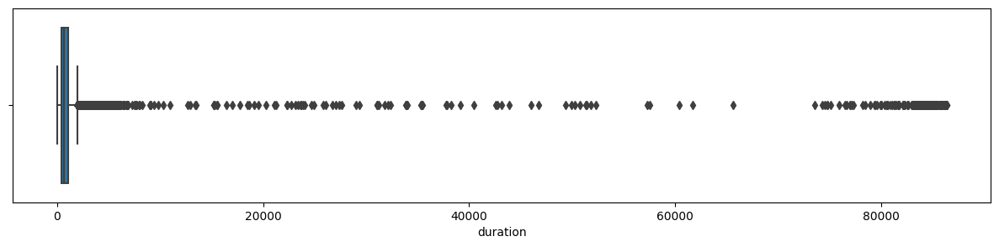

In [61]:
# Box plot

plt.figure(figsize=(15,3))
sns.boxplot(data = df, x='duration')
plt.show()

In [62]:
# Analisis statistik kolom duration

Q1_duration = df['duration'].quantile(0.25)
Q3_duration = df['duration'].quantile(0.75)
IQR_duration = Q3_duration - Q1_duration

lower_bound_duration = Q1_duration - 1.5 * IQR_duration
upper_bound_duration = Q3_duration + 1.5 * IQR_duration

In [63]:
outliers_duration = df[(df['duration'] < lower_bound_duration) | (df['duration'] > upper_bound_duration)]
outliers_duration.sort_values(by= 'duration', ascending=False)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
33850,2,2023-01-18 06:58:14,2023-01-19 06:57:10,N,1,74,41,1,1.09,7.9,0.0,0.5,0.00,0.00,1.0,9.40,1,1,0.00,2023,86336,0.045450
54199,2,2023-01-27 08:56:22,2023-01-28 08:55:17,N,1,43,239,1,1.89,11.4,0.0,0.5,3.91,0.00,1.0,19.56,1,1,2.75,2023,86335,0.078809
62120,2,2023-01-31 09:02:52,2023-02-01 09:01:47,N,1,41,42,1,0.87,7.9,0.0,0.5,0.00,0.00,1.0,9.40,1,1,0.00,2023,86335,0.036277
36253,2,2023-01-19 08:52:10,2023-01-20 08:51:03,N,3,75,75,1,0.04,23.0,0.0,0.0,7.20,0.00,1.0,31.20,1,1,0.00,2023,86333,0.001668
31477,2,2023-01-16 20:09:38,2023-01-17 20:08:24,N,1,42,43,1,1.63,10.7,1.0,0.5,0.66,0.00,1.0,13.86,1,1,0.00,2023,86326,0.067975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55916,1,2023-01-27 21:56:21,2023-01-27 22:29:04,N,1,210,210,1,6.90,35.2,1.0,1.5,0.00,0.00,1.0,37.70,2,1,0.00,2023,1963,12.654101
20853,1,2023-01-11 16:07:18,2023-01-11 16:40:01,N,1,65,138,1,11.10,44.3,7.5,1.5,10.65,0.00,1.0,63.95,1,1,0.00,2023,1963,20.356597
14426,2,2023-01-08 14:06:41,2023-01-08 14:39:24,N,1,95,80,1,7.80,40.1,0.0,0.5,8.32,0.00,1.0,49.92,1,1,0.00,2023,1963,14.304636
7064,1,2023-01-05 05:28:37,2023-01-05 06:01:19,N,1,242,197,1,0.00,39.5,0.0,1.5,0.00,6.55,1.0,47.55,1,1,0.00,2023,1962,0.000000


Mulai menghapus baris berdasarkan kolom `duration`

Setelah dilakukan 2 uji:
- Uji visual: Box plot di atas dapat dilihat range outliersnya
- Uji analisis statistik: ditemukan outliers sebanyak 3482 baris

Sekarang akan dicek dari outliers ini berdasarkan `duration` dan `fare_amount` terlebih dahulu:

- 10000 - 20000 (hapus 15 baris)

- 20000 - 40000 (hapus 36 baris)

- 40000 - 60000 (hapus 17 baris)

- 60000 < (hapus 182 baris)

Berdasarkan data di https://www.nyc.gov/site/tlc/passengers/taxi-fare.page

Plus 70 cents per 1/5 mile when traveling above 12mph or per 60 seconds in slow traffic or when the vehicle is stopped.

Dari statement di atas, akan digunakan asumsi untuk mengukur fare amountnya. Asumsi apabila taxi tidak bergerak sama sekali dan nilai fare amountnya berbeda jauh dari ((duration/60)*0.7). Maka baris akan dihapus.

In [64]:
# Mengecek data duration > 60000
# pd.set_option('display.max_rows', None)
pd.reset_option('display.max_rows')
outliers_duration[outliers_duration['duration'] > 60000].sort_values(by='duration', ascending=False)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
33850,2,2023-01-18 06:58:14,2023-01-19 06:57:10,N,1,74,41,1,1.09,7.9,0.0,0.5,0.00,0.0,1.0,9.40,1,1,0.00,2023,86336,0.045450
54199,2,2023-01-27 08:56:22,2023-01-28 08:55:17,N,1,43,239,1,1.89,11.4,0.0,0.5,3.91,0.0,1.0,19.56,1,1,2.75,2023,86335,0.078809
62120,2,2023-01-31 09:02:52,2023-02-01 09:01:47,N,1,41,42,1,0.87,7.9,0.0,0.5,0.00,0.0,1.0,9.40,1,1,0.00,2023,86335,0.036277
36253,2,2023-01-19 08:52:10,2023-01-20 08:51:03,N,3,75,75,1,0.04,23.0,0.0,0.0,7.20,0.0,1.0,31.20,1,1,0.00,2023,86333,0.001668
31477,2,2023-01-16 20:09:38,2023-01-17 20:08:24,N,1,42,43,1,1.63,10.7,1.0,0.5,0.66,0.0,1.0,13.86,1,1,0.00,2023,86326,0.067975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19370,2,2023-01-10 23:52:35,2023-01-11 20:30:20,N,1,7,226,1,1.56,10.0,1.0,0.5,2.50,0.0,1.0,15.00,1,1,0.00,2023,74265,0.075621
38344,2,2023-01-19 23:10:52,2023-01-20 19:37:07,N,1,82,56,1,2.10,14.9,1.0,0.5,0.00,0.0,1.0,17.40,1,1,0.00,2023,73575,0.102752
30235,2,2023-01-16 03:27:18,2023-01-16 21:41:12,N,5,82,82,1,0.82,15.0,0.0,0.0,0.00,0.0,0.3,15.30,1,2,0.00,2023,65634,0.044977
4808,2,2023-01-04 06:51:45,2023-01-05 00:00:00,N,1,95,86,1,12.22,56.2,0.0,0.5,0.00,0.0,1.0,57.70,2,1,0.00,2023,61695,0.713056


In [65]:
# Mengecek data duration > 60000
df[df['duration'] > 60000]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
49,2,2023-01-01 00:23:04,2023-01-01 23:18:32,N,1,255,48,1,8.55,47.8,1.0,0.5,5.30,0.0,1.0,58.35,1,1,2.75,2023,82528,0.372964
108,2,2023-01-01 01:53:59,2023-01-02 00:00:00,N,1,260,223,1,2.64,14.9,1.0,0.5,0.00,0.0,1.0,17.40,1,1,0.00,2023,79561,0.119456
118,2,2023-01-01 01:25:46,2023-01-02 00:29:15,N,1,129,37,1,6.53,31.0,1.0,0.5,0.00,0.0,1.0,33.50,2,1,0.00,2023,83009,0.283198
207,2,2023-01-01 03:12:42,2023-01-02 02:03:43,N,5,129,129,1,0.72,20.0,0.0,0.0,6.09,0.0,0.3,26.39,1,2,0.00,2023,82261,0.031509
262,2,2023-01-01 04:03:36,2023-01-02 03:31:50,N,1,65,37,5,3.61,20.5,1.0,0.5,0.00,0.0,1.0,23.00,2,1,0.00,2023,84494,0.153810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62120,2,2023-01-31 09:02:52,2023-02-01 09:01:47,N,1,41,42,1,0.87,7.9,0.0,0.5,0.00,0.0,1.0,9.40,1,1,0.00,2023,86335,0.036277
62510,2,2023-01-31 12:41:35,2023-02-01 12:05:19,N,1,75,42,1,2.17,12.8,0.0,0.5,0.00,0.0,1.0,14.30,2,1,0.00,2023,84224,0.092753
62591,2,2023-01-31 13:58:22,2023-02-01 11:46:10,N,1,130,130,1,0.10,3.7,0.0,0.5,0.00,0.0,1.0,5.20,2,1,0.00,2023,78468,0.004588
62653,2,2023-01-31 13:57:30,2023-02-01 10:49:04,N,1,244,43,3,5.74,31.0,0.0,0.5,0.00,0.0,0.3,34.55,1,1,2.75,2023,75094,0.275175


In [66]:
# menghapus baris yang durationnya di atas 60000
total_rows_before = df.shape[0]
df = df.drop(df[df['duration'] > 60000].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 182


In [67]:
# Mengecek data di duration >= 40000 & <= 60000
df[(df['duration'] >= 40000) & (df['duration'] <= 60000)]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
7562,2,2023-01-05 10:16:39,2023-01-06,N,1,260,226,1,0.70,5.8,0.0,0.5,0.00,0.00,1.0,7.30,2,1,0.00,2023,49401,0.051011
7825,2,2023-01-05 12:01:17,2023-01-06,N,1,40,40,2,0.25,5.8,0.0,0.5,0.00,0.00,1.0,7.30,2,1,0.00,2023,43123,0.020871
14007,2,2023-01-08 09:42:43,2023-01-09,N,1,134,160,1,5.60,22.6,0.0,0.5,0.00,0.00,1.0,24.10,1,1,0.00,2023,51437,0.391936
17752,2,2023-01-10 09:36:39,2023-01-11,N,1,181,97,1,1.64,14.2,0.0,0.5,3.14,0.00,1.0,18.84,1,1,0.00,2023,51801,0.113975
19679,2,2023-01-11 08:05:48,2023-01-12,N,1,74,24,1,1.65,12.1,0.0,0.5,0.00,0.00,1.0,13.60,1,1,0.00,2023,57252,0.103752
20264,2,2023-01-11 12:07:35,2023-01-12,N,5,226,260,1,0.20,10.0,0.0,0.0,0.00,0.00,1.0,11.00,1,2,0.00,2023,42745,0.016844
24683,2,2023-01-13 11:48:20,2023-01-14,N,1,95,95,2,0.78,7.9,0.0,0.5,0.94,0.00,1.0,10.34,1,1,0.00,2023,43900,0.063964
34138,2,2023-01-18 09:27:53,2023-01-19,N,1,95,170,2,9.22,43.6,0.0,0.5,5.44,6.55,1.0,59.84,1,1,2.75,2023,52327,0.634319
36213,2,2023-01-19 08:01:02,2023-01-20,N,1,42,41,1,1.48,10.7,0.0,0.5,0.00,0.00,1.0,12.20,2,1,0.00,2023,57538,0.092600
36397,2,2023-01-19 09:45:04,2023-01-20,N,5,33,138,1,10.99,50.0,5.0,0.0,25.20,0.00,1.0,81.20,1,2,0.00,2023,51296,0.771288


In [68]:
# menghapus baris yang durationnya di antara 40000 dan 60000
total_rows_before = df.shape[0]
df = df.drop(df[(df['duration'] >= 40000) & (df['duration'] <= 60000)].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 17


In [69]:
# Mengecek data di duration >= 20000 & <= 40000
df[(df['duration'] >= 20000) & (df['duration'] <= 40000)]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
556,2,2023-01-01 13:07:46,2023-01-01 19:45:18,N,1,223,8,1,16.00,292.8,0.0,0.5,0.00,0.00,1.0,294.30,2,1,0.00,2023,23852,2.414892
739,2,2023-01-01 15:22:20,2023-01-02 00:00:00,N,1,74,75,1,1.37,10.0,0.0,0.5,0.00,0.00,1.0,11.50,2,1,0.00,2023,31060,0.158789
1989,2,2023-01-02 14:33:21,2023-01-03 00:00:00,N,1,236,138,1,8.34,33.8,5.0,0.5,11.71,6.55,1.0,58.56,1,1,0.00,2023,33999,0.883085
3169,2,2023-01-03 00:00:00,2023-01-03 09:24:54,N,1,74,262,1,2.56,18.4,0.0,0.5,0.00,0.00,1.0,22.65,2,1,2.75,2023,33894,0.271907
7322,2,2023-01-05 09:00:03,2023-01-05 15:18:38,N,5,134,134,1,66.18,15.0,0.0,0.0,0.00,0.00,1.0,18.75,2,1,2.75,2023,22715,10.488576
7731,2,2023-01-05 12:12:49,2023-01-05 19:53:49,N,1,223,223,1,25.48,348.1,0.0,0.5,0.00,0.00,1.0,349.60,2,1,0.00,2023,27660,3.316269
8204,2,2023-01-05 15:51:05,2023-01-06 00:00:00,N,1,260,7,1,1.76,12.1,0.0,0.5,0.00,0.00,1.0,13.60,2,1,0.00,2023,29335,0.215988
8413,2,2023-01-05 16:23:19,2023-01-06 00:00:00,N,1,75,230,1,2.94,18.0,1.0,0.5,4.51,0.00,0.3,27.06,1,1,2.75,2023,27401,0.386263
14309,2,2023-01-08 13:30:46,2023-01-09 00:00:00,N,1,82,93,1,1.94,12.1,0.0,0.5,0.00,0.00,1.0,13.60,2,1,0.00,2023,37754,0.184987
14634,2,2023-01-08 16:28:51,2023-01-09 00:00:00,N,5,33,54,1,0.27,25.0,0.0,0.0,2.60,0.00,1.0,28.60,1,2,0.00,2023,27069,0.035908


Dari statement di atas, diambil asumsi bahwa apabila taxi tidak bergerak sama sekali dengan duration di atas ±20000,
fare amount seharusnya sudah memilki nilai $233. Jadi pada data ini, apabila fare amountnya di bawah $233 maka baris akan dihapus.

In [70]:
total_rows_before = df.shape[0]
df = df.drop(df[(df['duration'] >= 20000) & (df['duration'] <= 40000) & (df['fare_amount'] < 233)].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 36


Dari statement di atas, diambil asumsi bahwa apabila taxi tidak bergerak sama sekali dengan duration di atas ±10000,
fare amount seharusnya sudah memilki nilai $116. Jadi pada data ini, apabila fare amountnya di bawah $116 maka baris akan dihapus.

In [71]:
# Mengecek data di duration >= 10000 & <= 20000
df[(df['duration'] >= 10000) & (df['duration'] <= 20000)]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
973,2,2023-01-01 18:33:35,2023-01-02 00:00:00,N,1,129,129,1,1.10,10.0,0.0,0.5,0.00,0.0,1.0,11.50,2,1,0.0,2023,19585,0.202196
1142,2,2023-01-01 20:28:01,2023-01-02 00:00:00,N,1,83,226,1,0.00,17.0,1.0,0.5,0.00,0.0,1.0,19.50,2,1,0.0,2023,12719,0.000000
2014,2,2023-01-02 15:36:45,2023-01-02 20:44:45,N,1,223,223,1,2.35,218.6,0.0,0.5,0.00,0.0,1.0,220.10,2,1,0.0,2023,18480,0.457792
6815,2,2023-01-04 20:16:20,2023-01-05 00:00:00,N,1,66,112,1,4.44,21.2,1.0,0.5,4.74,0.0,1.0,28.44,1,1,0.0,2023,13420,1.191058
8767,2,2023-01-05 18:49:16,2023-01-06 00:00:00,N,1,7,179,1,0.89,8.6,2.5,0.5,2.52,0.0,1.0,15.12,1,1,0.0,2023,18644,0.171852
8835,2,2023-01-05 19:46:23,2023-01-06 00:00:00,N,1,75,95,1,11.74,47.8,2.5,0.5,0.00,0.0,0.3,51.10,1,1,0.0,2023,15217,2.777420
11315,2,2023-01-06 20:24:00,2023-01-07 00:00:00,N,1,260,255,1,4.82,23.3,1.0,0.5,1.29,0.0,1.0,27.09,1,1,0.0,2023,12960,1.338889
12615,2,2023-01-07 15:55:53,2023-01-07 20:38:53,N,1,223,223,1,20.43,230.5,0.0,0.5,0.00,0.0,1.0,232.00,2,1,0.0,2023,16980,4.331449
16175,2,2023-01-09 14:05:14,2023-01-09 18:18:55,N,5,134,95,1,28.67,45.0,0.0,0.0,0.00,0.0,1.0,46.00,2,1,0.0,2023,15221,6.780895
23872,2,2023-01-12 20:15:27,2023-01-13 00:00:00,N,1,82,258,1,3.32,18.4,1.0,0.5,0.00,0.0,1.0,20.90,2,1,0.0,2023,13473,0.887108


In [72]:
total_rows_before = df.shape[0]
df = df.drop(df[(df['duration'] >= 10000) & (df['duration'] <= 20000) & (df['fare_amount'] < 116)].index)
total_rows_after = df.shape[0]
jumlah_baris_terhapus = total_rows_before - total_rows_after
print(f"Jumlah baris yang dihapus: {jumlah_baris_terhapus}")

Jumlah baris yang dihapus: 15


In [73]:
# Mengecek data di duration >= 5000n  & <= 10000
# pd.set_option('display.max_rows', None)
pd.reset_option('display.max_rows')
df[(df['duration'] >= 5000) & (df['duration'] <= 10000)].sort_values(by='duration', ascending=False)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
3560,2,2023-01-03 13:05:16,2023-01-03 15:48:27,N,5,134,134,1,22.62,45.00,0.0,0.0,0.00,6.55,1.0,52.55,2,1,0.00,2023,9791,8.317026
5906,2,2023-01-04 15:57:57,2023-01-04 18:35:30,N,1,97,107,1,30.40,154.90,0.0,0.5,0.00,13.10,1.0,172.25,2,1,2.75,2023,9453,11.577277
51422,2,2023-01-26 06:10:10,2023-01-26 08:42:12,N,1,223,223,1,17.27,129.00,0.0,0.5,0.00,0.00,1.0,130.50,2,1,0.00,2023,9122,6.815611
21587,2,2023-01-11 21:28:35,2023-01-12 00:00:00,N,1,134,197,1,1.63,10.70,1.0,0.5,0.00,0.00,1.0,13.20,1,1,0.00,2023,9085,0.645900
39261,1,2023-01-20 13:43:16,2023-01-20 16:13:11,N,1,61,177,2,10.60,83.50,0.0,1.5,0.00,0.00,1.0,85.00,2,1,0.00,2023,8995,4.242357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15443,2,2023-01-09 07:41:24,2023-01-09 09:06:07,N,1,55,55,1,14.60,81.40,0.0,0.5,0.00,0.00,1.0,82.90,2,1,0.00,2023,5083,10.340350
37551,1,2023-01-19 17:38:33,2023-01-19 19:02:53,N,1,65,101,1,0.00,35.20,0.0,1.5,0.00,0.00,1.0,36.70,1,1,0.00,2023,5060,0.000000
36024,2,2023-01-19 05:50:26,2023-01-19 07:14:45,N,1,91,162,1,15.22,70.90,1.0,0.5,19.04,0.00,1.0,95.19,1,1,2.75,2023,5059,10.830599
64086,2,2023-01-02 09:11:00,2023-01-02 10:35:00,N,1,166,42,1,3.57,29.57,0.0,0.0,0.00,0.00,1.0,30.57,1,1,0.00,2023,5040,2.550000


## **Data yang sudah bersih**

Setelah kita membersihkan data, mari kita munculkan kembali data dan lihat sekilas informasi dari data yang telah dibersihkan.

In [74]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(min(2, df[col].nunique())).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)
print(df.shape)
dfDesc

(65747, 22)


,dataFeatures,dataType,null,unique,uniqueSample
0,VendorID,int64,0,2,"[2, 1]"
1,lpep_pickup_datetime,datetime64[ns],0,64380,"[2023-01-31T13:04:11.000000000, 2023-01-15T15:43:18.000000000]"
2,lpep_dropoff_datetime,datetime64[ns],0,64362,"[2023-01-19T17:11:18.000000000, 2023-01-11T12:17:20.000000000]"
3,store_and_fwd_flag,object,0,2,"[Y, N]"
4,RatecodeID,int32,0,5,"[1, 2]"
5,PULocationID,int64,0,220,"[58, 244]"
6,DOLocationID,int64,0,246,"[178, 37]"
7,passenger_count,int32,0,5,"[1, 4]"
8,trip_distance,float64,0,1751,"[19.26, 13.27]"
9,fare_amount,float64,0,2450,"[12.18, 35.23]"


- `Sebelum dibersihkan`
    dataset ini memiliki 68.211 baris data dan 20 kolom.
- `Setelah dibersihkan`
    dataset ini memiliki 65.747 baris data dan 22 kolom. Sekitar 1900 baris data yang kosong dihapus, dan sisa data kosong diisi dengan data yang dianggap relevan.

# **Data Analysis**

Setelah sudah menyelesaikan proses data cleaning, sekarang kita akan masuk ke bagian analisis untuk mencari tahu **bagaimana karakteristik perjalanan taksi dan limusin di New York City dapat dianalisis untuk mendapatkan wawasan yang lebih dalam tentang preferensi penumpang, efektivitas operasional, serta dampak kebijakan tarif dan peraturan transportasi pada sistem transportasi perkotaan?**

## Berdasarkan `trip_distance`

Mari kita cek untuk distribusi datanya

In [75]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

In [76]:
df[df['trip_distance'] > 40 ]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed
8072,2,2023-01-05 14:53:00,2023-01-05 16:19:20,N,1,130,1,1,41.74,114.0,...,0.0,18.3,0.3,133.1,1,1,0.0,2023,5180,29.008494


Text(0, 0.5, 'Jumlah Perjalanan')

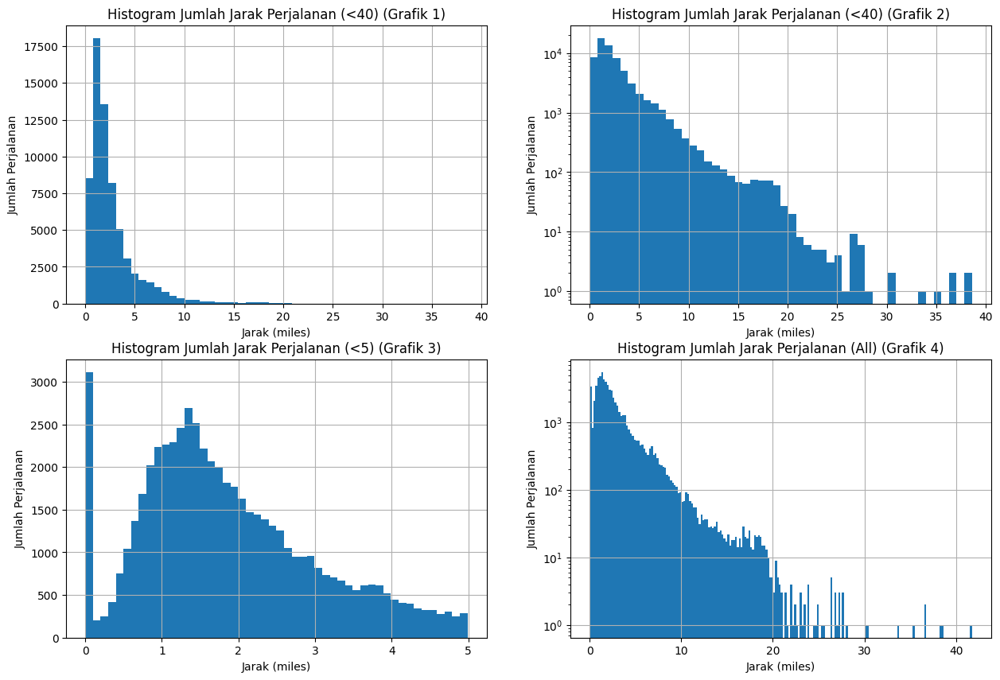

In [77]:
# Untuk membuat grafik ini, kita akan pasang batasan di bawah 40 miles
# Pada grafik 4 tidak akan dipasang batasan untuk sebagai pembanding dengan grafik lain

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize = (15,10))

df['trip_distance'][df['trip_distance'] < 40].hist(ax=ax1, bins=50)
ax1.set_title('Histogram Jumlah Jarak Perjalanan (<40) (Grafik 1)')
ax1.set_xlabel('Jarak (miles)')
ax1.set_ylabel('Jumlah Perjalanan')

df['trip_distance'][df['trip_distance'] < 40].hist(ax=ax2, bins=50)
ax2.set_yscale('log')
ax2.set_title('Histogram Jumlah Jarak Perjalanan (<40) (Grafik 2)')
ax2.set_xlabel('Jarak (miles)')
ax2.set_ylabel('Jumlah Perjalanan')


df['trip_distance'][df['trip_distance'] < 5].hist(ax=ax3, bins=50)
ax3.set_title('Histogram Jumlah Jarak Perjalanan (<5) (Grafik 3)')
ax3.set_xlabel('Jarak (miles)')
ax3.set_ylabel('Jumlah Perjalanan')

df['trip_distance'].hist(ax=ax4, bins=200)
ax4.set_yscale('log')
ax4.set_title('Histogram Jumlah Jarak Perjalanan (All) (Grafik 4)')
ax4.set_xlabel('Jarak (miles)')
ax4.set_ylabel('Jumlah Perjalanan')

In [151]:
df[df['trip_distance'] < 0.8]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,DOLocationName,PU_avg_tip,DO_avg_tip
104,1,2023-01-12 14:05:46,2023-01-12 14:24:09,N,1,41,143,1,0.00,14.00,...,1103,0.000000,Thursday,14,14,7.692308,Central Harlem,Lincoln Square West,1.676787,3.361379
225,1,2023-01-12 10:39:21,2023-01-12 11:00:16,N,1,75,143,1,0.00,20.04,...,1255,0.000000,Thursday,10,11,0.000000,East Harlem South,Lincoln Square West,2.176422,3.361379
227,1,2023-01-23 20:34:18,2023-01-23 20:48:26,N,1,75,143,1,0.00,16.57,...,848,0.000000,Monday,20,20,0.000000,East Harlem South,Lincoln Square West,2.176422,3.361379
343,2,2023-01-17 15:34:01,2023-01-17 15:46:49,N,1,43,143,3,0.33,12.10,...,768,1.546875,Tuesday,15,15,16.666667,Central Park,Lincoln Square West,2.777973,3.361379
431,1,2023-01-03 18:42:59,2023-01-03 19:01:57,N,1,231,143,1,0.00,23.50,...,1138,0.000000,Tuesday,18,19,0.000000,TriBeCa/Civic Center,Lincoln Square West,0.000000,3.361379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65716,2,2023-01-25 14:55:06,2023-01-25 14:55:14,N,5,108,108,1,0.04,10.00,...,8,18.000000,Wednesday,14,14,0.000000,Gravesend,Gravesend,0.342000,2.562727
65720,2,2023-01-11 16:00:05,2023-01-11 16:04:37,N,1,206,221,1,0.78,7.20,...,272,10.323529,Wednesday,16,16,0.000000,Saint George/New Brighton,Stapleton,0.400000,0.000000
65722,1,2023-01-13 19:51:38,2023-01-13 20:18:25,N,1,14,44,1,0.00,40.20,...,1607,0.000000,Friday,19,20,0.000000,Bay Ridge,Charleston/Tottenville,0.251273,0.000000
65725,1,2023-01-30 16:27:45,2023-01-30 17:24:38,N,1,197,214,1,0.00,65.50,...,3413,0.000000,Monday,16,17,0.000000,Richmond Hill,South Beach/Dongan Hills,0.989722,0.000000


Dari grafik di atas, dapat dilihat bahwa:
- Saat jarak > 1, semakin meningkatnya jarak, maka jumlah perjalanannya berkurang.
- Saat jarak < 1.4, semakin meningkatnya jarak, maka jumlah perjalanannya semakin meningkat.

1. Hipotesis 1

    Dapat dilihat bahwa karakteristik warga di New York cenderung lebih sering menggunakan taxi sebagai opsi utama apabila jarak tempuhnya pendek ±1-2 miles. Hal ini mungkin disebabkan apabila jaraknya jauh, warga di New York lebih memilih menggunakan alternatif lain contohnya seperti menggunakan bus atau kereta.

2. Hipotesis 2

    Warga New York cenderung mencari alternatif lain seperti bus atau kereta, apabila jarak perjalanannya jauh. Ini bisa saja disebabkan oleh pertimbangan biaya, durasi, dan kenyamanan. Penggunaan taxi untuk jarak jauh mungkin kurang efisien dan lebih mahal dibandingkan opsi alternatif lainnya.

3. Hipotesis 3

    Kondisi lalu lintas dan kemacetan mungkin memengaruhi keputusan penggunaan taksi. Warga New York mungkin memilih taksi untuk perjalanan jarak pendek karena lebih cepat dan lebih nyaman dalam lalu lintas perkotaan yang padat. Di sisi lain, untuk jarak jauh, pemilihan transportasi lain mungkin lebih efisien dalam mengatasi kemacetan.

### Menggunakan mean dan median dari `trip_distance` pada weekday dan weekend yang dikelompokkan berdasarkan jam per harinya.

In [78]:
# Mengambil nama hari dan jam dalam sehari dari kolom datetime
df['pickup_day'] = df['lpep_pickup_datetime'].dt.day_name() # Nama hari
df['pickup_hour'] = df['lpep_pickup_datetime'].dt.hour  # Jam dalam sehari
df['dropoff_hour'] = df['lpep_dropoff_datetime'].dt.hour  # Jam dalam sehari
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,total_amount,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,...,24.18,1,1,2.75,2023,661,14.051437,Sunday,0,0
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.70,...,15.84,1,1,0.00,2023,406,16.049261,Sunday,0,0
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.20,...,11.64,1,1,0.00,2023,380,0.000000,Sunday,0,0
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.50,...,10.20,1,1,0.00,2023,349,13.409742,Sunday,0,0
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.00,...,8.00,1,1,0.00,2023,358,11.061453,Sunday,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68205,2,2023-01-31 21:56:00,2023-01-31 22:14:00,N,1,75,186,1,3.92,20.72,...,25.02,1,1,0.00,2023,1080,13.066667,Tuesday,21,22
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1,10,205,1,2.14,4.41,...,5.41,1,1,0.00,2023,480,16.050000,Tuesday,22,22
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,1,66,37,1,3.44,16.53,...,21.04,1,1,0.00,2023,960,12.900000,Tuesday,23,0
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,1,225,189,1,3.03,14.98,...,19.18,1,1,0.00,2023,1080,10.100000,Tuesday,23,23


In [79]:
# Membuat variabel dari rata-rata jarak perjalanan (trip_distance) yang dikelompokkan
# berdasarkan jam pickup dan dropoff
distance_pickup_mean = df['trip_distance'].groupby(df['pickup_hour']).mean()
distance_dropoff_mean = df['trip_distance'].groupby(df['dropoff_hour']).mean()

In [80]:
# Membuat variabel dari median jarak perjalanan (trip_distance) yang dikelompokkan
# berdasarkan jam pickup dan dropoff

distance_pickup_median = df['trip_distance'].groupby(df['pickup_hour']).median()
distance_dropoff_median = df['trip_distance'].groupby(df['dropoff_hour']).median()

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option i

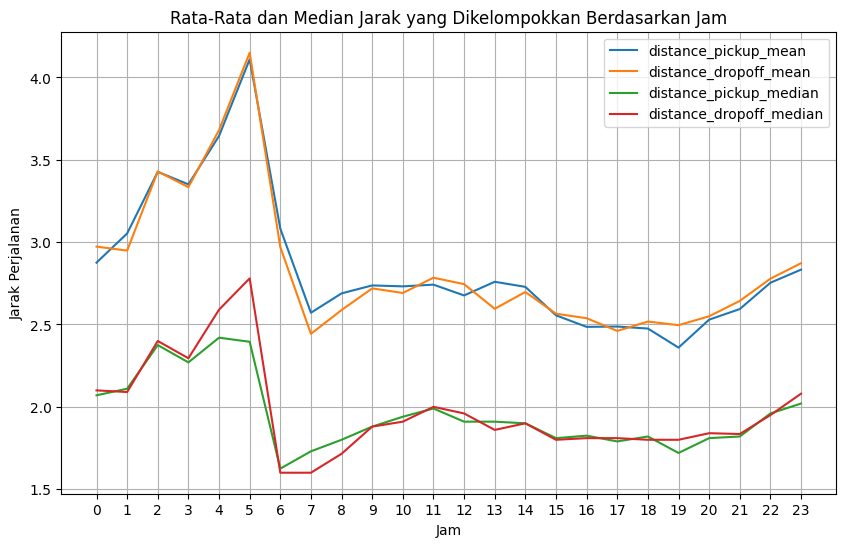

In [81]:
plt.figure(figsize=(10, 6))

# Plot data distance_pickup_mean
sns.lineplot(x=distance_pickup_mean.index, y=distance_pickup_mean.values, label='distance_pickup_mean')

# Plot data distance_dropoff_mean
sns.lineplot(x=distance_dropoff_mean.index, y=distance_dropoff_mean.values, label='distance_dropoff_mean')

# Plot data distance_pickup_median
sns.lineplot(x=distance_pickup_median.index, y=distance_pickup_median.values, label='distance_pickup_median')

# Plot data distance_dropoff_mean
sns.lineplot(x=distance_dropoff_median.index, y=distance_dropoff_median.values, label='distance_dropoff_median')

plt.title('Rata-Rata dan Median Jarak yang Dikelompokkan Berdasarkan Jam')
plt.xlabel('Jam')
plt.ylabel('Jarak Perjalanan')
plt.xticks(range(24))
plt.grid(True)
plt.legend(loc='best')
plt.show()

### Dari grafik di atas, dapat dilihat bahwa:

1. Jarak perjalanan yang dikelompokkan terhadap pickup dan dropoff memiliki pola yang mirip.
2. Rata-rata jarak perjalanan selalu berada di atas Median jarak perjalanan.
3. Tren rata-rata dan median jarak perjalanan memiliki trend yang serupa, berikut akan diambil kesimpulan berdasarkan rentang waktunya.
    - Jarak paling pendek ada di rentang jam 6am - 8pm
    - Jarak sedang ada di rentang jam 8pm - 4am
    - Jarak paling panjang ada di rentang jam 4am - 6am

Kesimpulan
1. Perjalanan jarak panjang cenderung terjadi di pagi hari pukul 4am - 6am di saat warga berangkat bekerja
2. Untuk perjalanan jarak pendek dan sedang cenderung terjadi di rentang pukul 6 am - 4am di saat pagi ke subuh.

#### Berikutnya kita akan mengklasifikasikan rata-rata jumlah perjalanan per jamnya  dan mencari rata-rata pendapatan per jamnya pada weekday dan weekend.

In [82]:
# Memisahkan data menjadi weekday dan weekend
weekday_data = df[df['pickup_day'].isin(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'])]
weekend_data = df[df['pickup_day'].isin(['Saturday', 'Sunday'])]

In [83]:
# Membuat variabel permintaan penumpang per jam di weekday
hourly_counts_weekday = weekday_data['pickup_hour'].value_counts().sort_index()

# Membuat variabel permintaan penumpang per jam di weekend
hourly_counts_weekend = weekend_data['pickup_hour'].value_counts().sort_index()

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option i

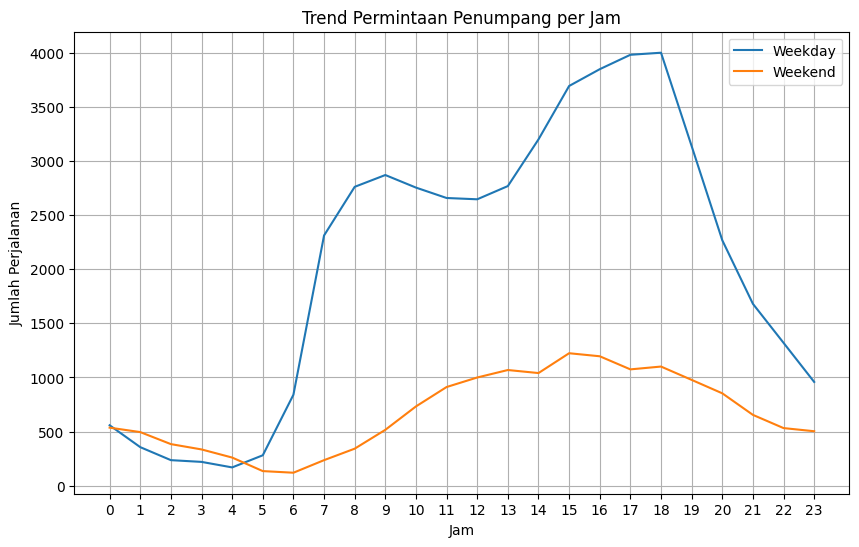

In [84]:
plt.figure(figsize=(10, 6))

# Plot data weekday
sns.lineplot(x=hourly_counts_weekday.index, y=hourly_counts_weekday.values, label='Weekday')

# Plot data weekend
sns.lineplot(x=hourly_counts_weekend.index, y=hourly_counts_weekend.values, label='Weekend')

plt.title('Trend Permintaan Penumpang per Jam')
plt.xlabel('Jam')
plt.ylabel('Jumlah Perjalanan')
plt.xticks(range(24))
plt.grid(True)
plt.legend(loc='best')
plt.show()

##### Dari grafik di Trend Permintaan Penumpang per Jam, dapat dilihat bahwa:

Trend jumlah perjalanan dibagi menjadi 2, yaitu pada Weekday & Weekend:

Weekday
- Jumlah perjalanan paling banyak di jam 3pm - 6pm.
- Jumlah perjalanan paling sedikit di jam 12am - 5am.

Weekend
- Jumlah perjalanan paling banyak di jam 2pm - 6pm.
- Jumlah perjalanan paling sedikit di jam 11pm - 6am.

In [85]:
# Membuat variabel dari rata-rata total pendapatan (total_amount) yang dikelompokkan terhadap pickup_hour di weekday
hourly_income_weekday = weekday_data.groupby('pickup_hour')['total_amount'].mean()

# Membuat variabel dari rata-rata total pendapatan (total_amount) yang dikelompokkan terhadap pickup_hour di weekend
hourly_income_weekend = weekend_data.groupby('pickup_hour')['total_amount'].mean()

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option i

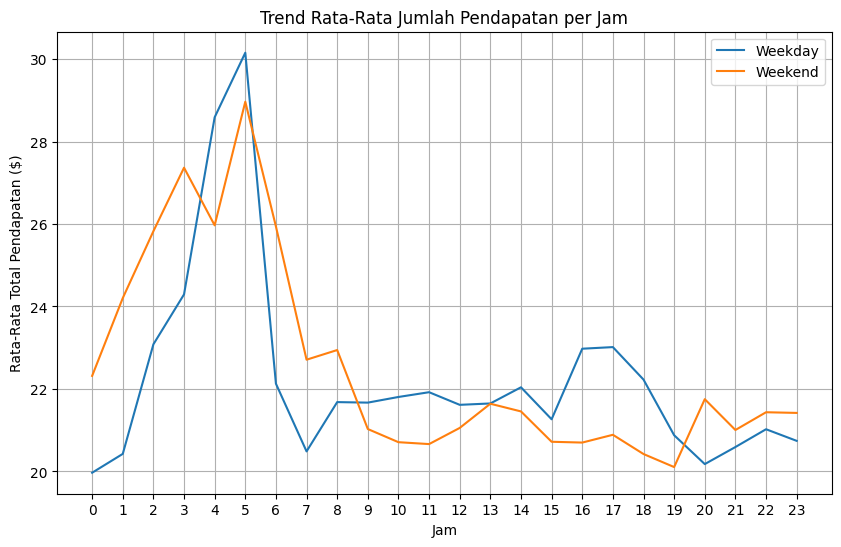

In [86]:
plt.figure(figsize=(10, 6))

# Plot data weekday
sns.lineplot(x=hourly_income_weekday.index, y=hourly_income_weekday.values, label='Weekday')

# Plot data weekend
sns.lineplot(x=hourly_income_weekend.index, y=hourly_income_weekend.values, label='Weekend')

plt.title('Trend Rata-Rata Jumlah Pendapatan per Jam')
plt.xlabel('Jam')
plt.ylabel('Rata-Rata Total Pendapatan ($)')
plt.xticks(range(24))
plt.grid(True)
plt.legend(loc='best')
plt.show()

##### Dari grafik di Trend Jumlah Pendapatan per Jam, dapat dilihat bahwa:

Trend jumlah Pendapatan per jam dibagi menjadi 2, yaitu pada Weekday & Weekend:

Weekday
- Jumlah pendapatan paling besar di jam 4am - 5am.
- Jumlah pendapatan paling kecil di jam 12am - 1am & di jam 8pm - 9pm.

Weekend
- Jumlah pendapatan paling besar di jam 4am - 6am.
- Jumlah pendapatan paling kecil di jam 5pm & 7pm.

##### Insight

1. Trend Jumlah Pendapatan per Jam:

- Pada hari Weekday, jumlah pendapatan paling tinggi ada di pagi hari, khususnya di jam 4 pagi hingga 5 pagi. Ini mungkin disebabkan oleh permintaan tinggi di jam sibuk menuju tempat kerja atau bandara.
- Di sisi lain, jumlah pendapatan paling rendah terjadi di jam 12 pagi hingga 1 pagi dan 8 malam hingga 9 malam.
- Pada Weekend, jumlah pendapatan paling tinggi juga terjadi di pagi hari, khususnya di jam 4 pagi hingga 6 pagi. Ini mungkin disebabkan oleh perjalanan ke bandara atau tujuan berlibur.

2. Trend Jumlah Perjalanan per Jam:

- Pada hari Weekday, jumlah perjalanan paling banyak terjadi di sore hari, khususnya di jam 3 sore hingga 6 sore. Hal ini mungkin disebabkan oleh perjalanan pulang kerja atau aktivitas lainnya di sore hari.
- Jumlah perjalanan paling sedikit di hari Weekday terjadi di tengah malam hingga pagi hari (jam 12 malam hingga 5 pagi). Ini mencerminkan periode ketika aktivitas perjalanan biasanya lebih rendah.
- Pada Weekend, jumlah perjalanan paling banyak juga terjadi di sore hari, di jam 2 sore hingga 6 sore. Ini mungkin disebabkan oleh perjalanan rekreasi atau liburan di akhir pekan.
- Jumlah perjalanan paling sedikit di Weekend terjadi pada tengah malam hingga pagi hari (jam 11 malam hingga 6 pagi).

Dari kedua trend tersebut, terlihat bahwa ada pola yang berbeda dalam jumlah trend pendapatan dan jumlah perjalanan antara Weekday & Weekend.

## Berdasarkan Income:

Selanjutnya kita akan menganalisis bagaimana perubahan tarif `RatecodeID` memengaruhi pendapatan pengemudi

In [87]:
ratecode_income = df.groupby('RatecodeID')['total_amount'].mean().reset_index()
ratecode_income

,RatecodeID,total_amount
0,1,21.326066
1,2,84.932434
2,3,73.272500
3,4,65.016667
4,5,34.250264


In [88]:
df['RatecodeID'].value_counts().sort_index()

RatecodeID
1    64396
2      152
3       20
4        3
5     1176
Name: count, dtype: int64

Text(0, 0.5, 'Jumlah Data')

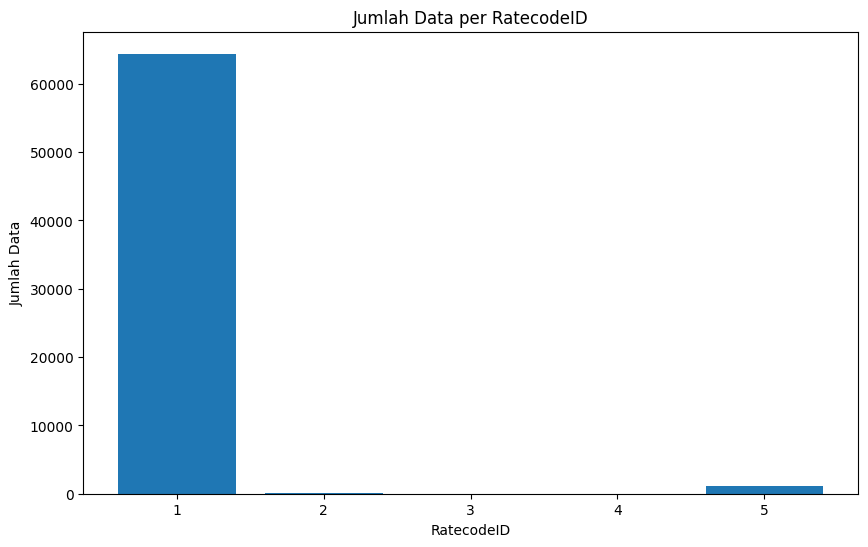

In [89]:
plt.figure(figsize=(10, 6))
plt.bar(df['RatecodeID'].value_counts().sort_index().index, df['RatecodeID'].value_counts().sort_index().values)
plt.title('Jumlah Data per RatecodeID')
plt.xlabel('RatecodeID')
plt.ylabel('Jumlah Data')

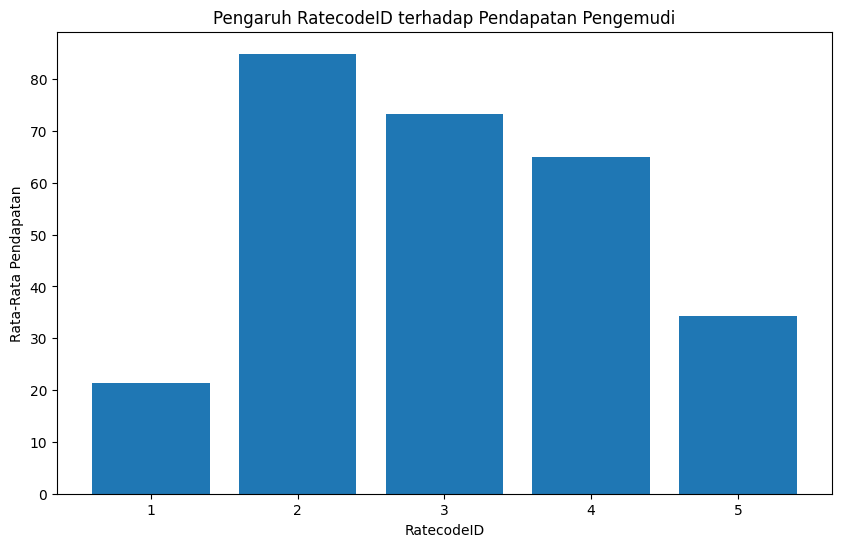

In [90]:
plt.figure(figsize=(10, 6))
plt.bar(ratecode_income['RatecodeID'], ratecode_income['total_amount'])
plt.xlabel('RatecodeID')
plt.ylabel('Rata-Rata Pendapatan')
plt.title('Pengaruh RatecodeID terhadap Pendapatan Pengemudi')
plt.xticks(ratecode_income['RatecodeID'])
plt.show()

Untuk lebih detailnya, kita akan breakdown masing-masing faktor biaya yang memengaruhi nilai `total_amount`. Berikut adalah faktor-faktornya:
- `fare_amount`
- `tip_amount`
- `extra`
- `tolls_amount`
- `improvement_surcharge`
- `congestion_surcharge`

Setelah kita mengetahui hasilnya, maka kita dapat menjawab beberapa pertanyaan dalam analisis ini sbb:
- Dari semua biaya yang dikenakan terhadap penumpang, biaya mana yang paling berpengaruh terhadap jumlah total pendapatan bagi pengemudi?
- Bagaimana tiap RatecodeID memengaruhi pendapatan rata-rata pengemudi?
- Bagaimana RatecodeID memengaruhi jumlah tip yang diberikan oleh penumpang?
- Apakah terdapat perbedaan dalam biaya tambahan ekstra berdasarkan RatecodeID?
- Apakah ada dampak perubahan RatecodeID pada biaya peningkatan pelayanan dan biaya kemacetan?

In [91]:
# Membuat variabel dari rata-rata total_amount, fare_amount, tip_amount, extra, tolls_amount,
# improvement_surcharge, dan congestion_surcharge yang dikelompokkan terhadap RatecodeID

ratecode_income = df.groupby('RatecodeID')[['total_amount', 'fare_amount', 'tip_amount', 'extra', 'tolls_amount', 'improvement_surcharge', 'congestion_surcharge']].mean().reset_index()
ratecode_income

,RatecodeID,total_amount,fare_amount,tip_amount,extra,tolls_amount,improvement_surcharge,congestion_surcharge
0,1,21.326066,16.109891,2.126235,0.855022,0.148831,0.960032,0.696705
1,2,84.932434,69.644737,8.383421,0.888158,4.481579,0.953947,0.072368
2,3,73.272500,58.405000,6.520000,0.525000,6.892500,0.930000,0.000000
3,4,65.016667,56.600000,1.666667,0.833333,4.916667,0.666667,0.000000
4,5,34.250264,30.324949,2.335944,0.157313,0.292049,0.856888,0.271259


C:\Users\ASUS\AppData\Local\Temp\ipykernel_45000\665328194.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=ratecode_income.melt(id_vars='RatecodeID'), x='RatecodeID', y='value', hue='variable', ci=None)
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

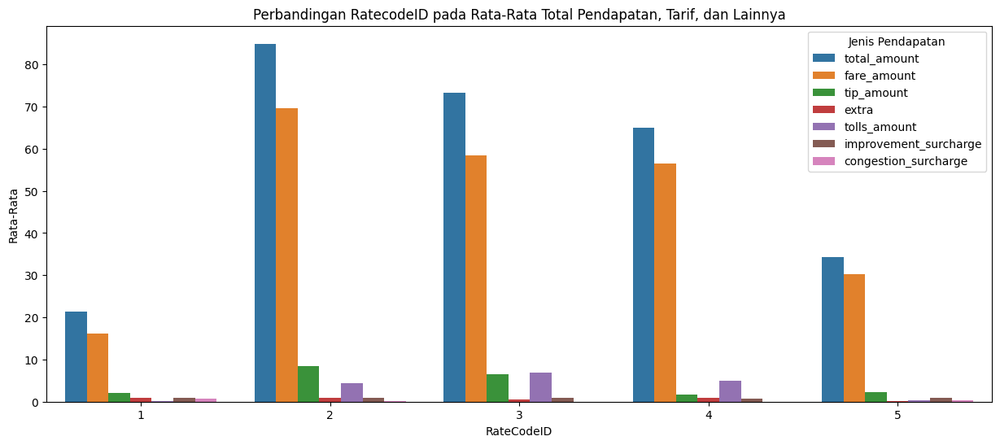

In [148]:
plt.figure(figsize=(15, 6))
sns.barplot(data=ratecode_income.melt(id_vars='RatecodeID'), x='RatecodeID', y='value', hue='variable', ci=None)
plt.xlabel('RateCodeID')
plt.ylabel('Rata-Rata')
plt.title('Perbandingan RatecodeID pada Rata-Rata Total Pendapatan, Tarif, dan Lainnya')
plt.legend(title='Jenis Pendapatan', loc='best')
plt.show()

### Insight

Dari grafik di atas, kita dapat menjawab pertanyaan-pertanyaan ini:
- Dari semua biaya yang dikenakan terhadap penumpang, biaya mana yang paling berpengaruh terhadap jumlah total pendapatan bagi pengemudi?
    - Fare_amount merupakan biaya yang berpengaruh paling besar terhadap total_amount.
<br><br>
- Bagaimana tiap RatecodeID memengaruhi pendapatan rata-rata pengemudi?
    - Pendapatan paling besar dimiliki oleh RatecodeID 4. Untuk pendapatan kedua dan ketiga terbesar dimiliki oleh RatecodeID 2 & 3 yang memiliki nilai hampir serupa.
<br><br>
- Bagaimana RatecodeID memengaruhi jumlah tip yang diberikan oleh penumpang?
    - Jumlah tip paling banyak didapatkan oleh RatecodeID 2 & 3 di mana itu adalah perjalanan ke bandara.
<br><br>
- Apakah terdapat perbedaan dalam biaya tambahan ekstra berdasarkan RatecodeID?
    - Tidak ada perbedaan signifikan dalam biaya tambahan ekstra berdasarkan RatecodeID.
<br><br>
- Apakah ada dampak perubahan RatecodeID pada biaya peningkatan pelayanan dan biaya kemacetan?
    - Untuk improvement_surcharge, nilai yang dimiliki tiap RatecodeID memiliki nilai yang sama. Ada 3 RatecodeID yang memiliki nilai 0:
        1. RatecodeID 2: congestion_surcharge 0 dikarenakan perjalanan ke bandara menggunakan jalan toll, sehingga tidak terjebak kemacetan.
        2. RatecodeID 3: congestion_surcharge 0 dikarenakan perjalanan ke bandara menggunakan jalan toll, sehingga tidak terjebak kemacetan.
        3. RatecodeID 4: congestion_surcharge 0 dikarenakan ada perjalanan yang menggunakan jalan toll dan perjalanan di luar NYC tidak ada kemacetan.

## Berdasarkan `passenger_count`:

Apakah perbedaan dalam jumlah penumpang (`passenger_count`) berdampak pada jumlah tip (`tip_amount`)?

In [93]:
# cek distribusi kolom tip_amount

stats, pval=normaltest(df['tip_amount'])
if pval<=0.05:
    print('tidak normal') #Ha
else: 
    print('distribusi normal') #Ho 

tidak normal


In [94]:
passenger_count_tip_median = df.groupby('passenger_count')['tip_amount'].median().reset_index()
passenger_count_tip_median

,passenger_count,tip_amount
0,1,1.650
1,2,1.495
2,3,1.390
3,4,1.910
4,5,2.010


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


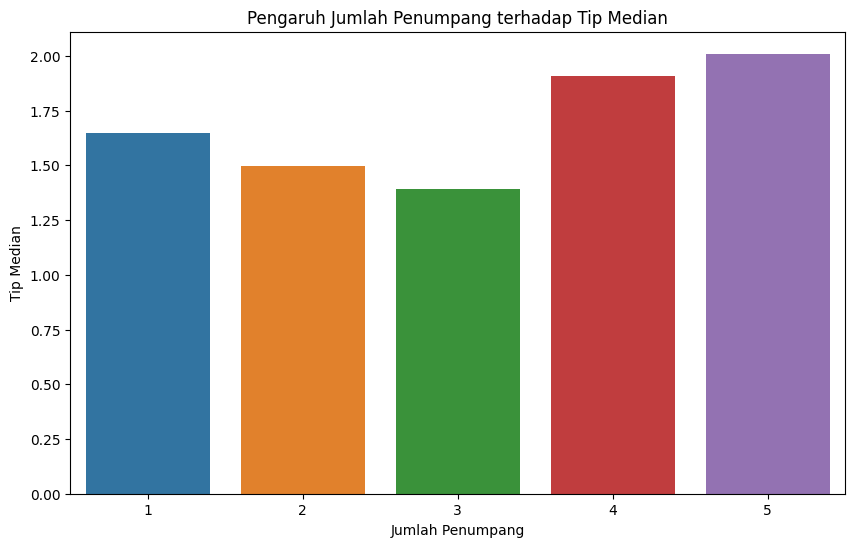

In [95]:
# Visualisasi hasil
plt.figure(figsize=(10, 6))
sns.barplot(x='passenger_count', y='tip_amount', data=passenger_count_tip_median)
plt.title('Pengaruh Jumlah Penumpang terhadap Tip Median')
plt.xlabel('Jumlah Penumpang')
plt.ylabel('Tip Median')
plt.show()

Kita akan menggunakan uji Kruskal-Wallis dikarenakan data tidak terdistribusi dengan normal

Hipotesis:
- Ho: Median tip_amount untuk setiap kelompok adalah sama
- Ha: Setidaknya ada satu kelompok memiliki median tip_amount yang berbeda secara signifikan. Tetapi kita tidak tahu yang mana.

In [96]:
stat, pvalue = kruskal(
    df[df['passenger_count'] == 1]['tip_amount'],
    df[df['passenger_count'] == 2]['tip_amount'],
    df[df['passenger_count'] == 3]['tip_amount'],
    df[df['passenger_count'] == 4]['tip_amount'],
    df[df['passenger_count'] == 5]['tip_amount']
)

pvalue

4.165345146910012e-06

In [97]:
# Conclusion
if pvalue > 0.05:
    print(f'''    
    pvalue = {pvalue:.5f}. pvalue > 0.05. Gagal menolak Ho.
    Kita TIDAK punya cukup bukti untuk mengatakan bahwa minimal salah satu kelompok ada yang berbeda median tip_amountnya. Tetapi kita tidak tahu kelompok yang mana.
    (Mediannya TIDAK berbeda signifikan)
    ''')
else:
    print(f'''
    pvalue = {pvalue:.5f}. pvalue <= 0.05. Menolak Ho.
    Kita punya cukup bukti untuk mengatakan bahwa minimal salah satu kelompok ada yang berbeda median tip_amountnya. Tetapi kita tidak tahu kelompok yang mana.
    (Mediannya berbeda signifikan)
    ''')


    pvalue = 0.00000. pvalue <= 0.05. Menolak Ho.
    Kita punya cukup bukti untuk mengatakan bahwa minimal salah satu kelompok ada yang berbeda median tip_amountnya. Tetapi kita tidak tahu kelompok yang mana.
    (Mediannya berbeda signifikan)
    


Berikutnya kita akan mencari tahu apakah median tip_amount kelompok '5' berbeda signifikan dengan median tip_amount kelompok '4'

Hipotesis :

- Ho : Median tip_amount kelompok '5' = Median tip_amount kelompok '4'
- Ha : Median tip_amount kelompok '5' != Median tip_amount kelompok '4'

In [98]:
stat, pvalue = mannwhitneyu(
    x = df[df['passenger_count'] == 5]['tip_amount'],
    y = df[df['passenger_count'] == 4]['tip_amount']
)

pvalue

0.11727110958503151

In [99]:
if pvalue > 0.05:
    print(f'''
    pvalue = {pvalue:.5f}. pvalue > 0.05. Gagal menolak Ho.
    Kita TIDAK punya cukup bukti untuk mengatakan bahwa median tip_amount kelompok '5' tidak sama dengan median tip_amount kelompok '4'
    (Rata-rata TIDAK berbeda signifikan)
    ''')
else:
    print(f'''
    pvalue = {pvalue:.5f}. pvalue <= 0.05. Menolak Ho.
    Kita punya cukup bukti untuk mengatakan bahwa median tip_amount kelompok '5' tidak sama dengan median tip_amount kelompok '4'
    (Rata-rata berbeda signifikan)
    ''')


    pvalue = 0.11727. pvalue > 0.05. Gagal menolak Ho.
    Kita TIDAK punya cukup bukti untuk mengatakan bahwa median tip_amount kelompok '5' tidak sama dengan median tip_amount kelompok '4'
    (Rata-rata TIDAK berbeda signifikan)
    


### Insight

Ternyata memang tidak ada perbedaan dari median jumlah tip yang signifikan antara kelompok jumlah penumpang 4 dan 5 orang. Namun ada perbedaan yang signifikan apabila dibandingkan dengan kelompok jumlah penumpang 1, 2, dan 3 orang. Dari sini dapat disimpulkan bahwa median jumlah tip paling besar diberikan oleh kelompok jumlah penumpang yang terdiri dari 4 dan 5 orang, sedangkan median jumlah tip terkecil diberikah oleh kelompok jumlah penumpang yang terdiri dari 3 orang.

## Berdasarkan `congestion_surcharge` & `tip_amount`

Sekarang kita ingin mencari tahu apakah ada perbedaan signifikan dalam `congestion_surcharge` dan `tip_amount` terhadap `total_amount ` pada jam-jam tertentu dalam sehari.

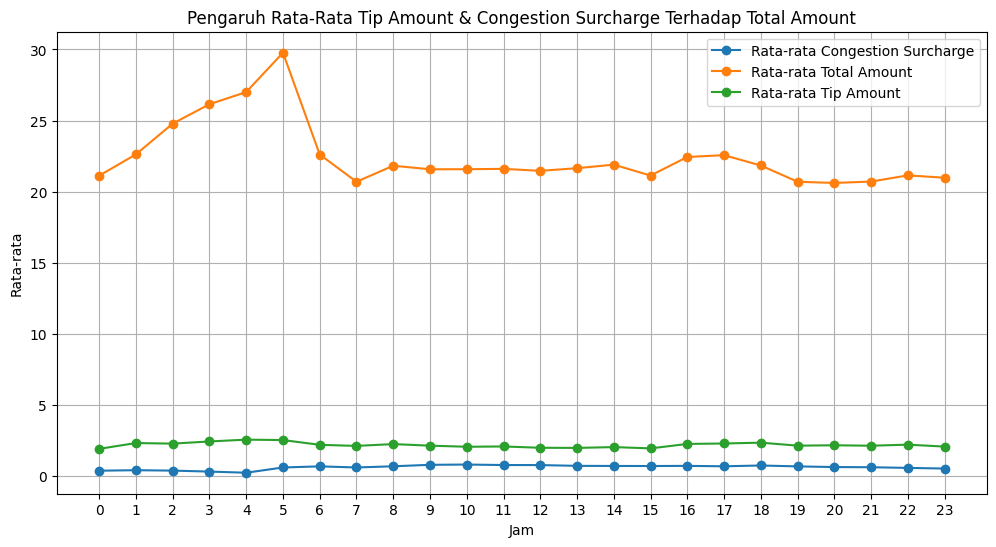

In [100]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Mengelompokkan data berdasarkan jam perjalanan dan menghitung rata-rata congestion_surcharge, total_amount, dan tip_amount
hourly_congestion_surcharge_mean = df.groupby('pickup_hour')['congestion_surcharge'].mean()
hourly_total_amount_mean = df.groupby('pickup_hour')['total_amount'].mean()
hourly_tip_amount_mean = df.groupby('pickup_hour')['tip_amount'].mean()

# Membuat plot untuk rata-rata congestion_surcharge
plt.figure(figsize=(12, 6))
plt.plot(hourly_congestion_surcharge_mean.index, hourly_congestion_surcharge_mean.values, marker='o', label='Rata-rata Congestion Surcharge')
plt.xlabel('Jam')
plt.ylabel('Rata-rata')
plt.xticks(range(24))
plt.grid(True)

# Membuat plot untuk rata-rata total_amount
plt.plot(hourly_total_amount_mean.index, hourly_total_amount_mean.values, marker='o', label='Rata-rata Total Amount')
plt.xlabel('Jam')
plt.ylabel('Rata-rata')
plt.xticks(range(24))
plt.grid(True)

# Membuat plot untuk rata-rata tip_amount
plt.plot(hourly_tip_amount_mean.index, hourly_tip_amount_mean.values, marker='o', label='Rata-rata Tip Amount')
plt.title('Pengaruh Rata-Rata Tip Amount & Congestion Surcharge Terhadap Total Amount')
plt.xlabel('Jam')
plt.ylabel('Rata-rata')
plt.xticks(range(24))
plt.grid(True)

plt.legend()
plt.show()

In [101]:
# Persentase congestion_surcharge terhadap total_amount per jamnya
display((hourly_congestion_surcharge_mean/hourly_total_amount_mean).round(4) * 100)

pickup_hour
0     1.79
1     1.82
2     1.55
3     1.21
4     0.87
5     2.03
6     3.02
7     2.92
8     3.16
9     3.67
10    3.76
11    3.59
12    3.61
13    3.32
14    3.25
15    3.35
16    3.20
17    3.05
18    3.41
19    3.29
20    3.08
21    3.00
22    2.72
23    2.53
dtype: float64

In [102]:
# Persentase tip_amount terhadap total_amount per jamnya
display((hourly_tip_amount_mean/hourly_total_amount_mean).round(4) * 100)

pickup_hour
0      9.07
1     10.27
2      9.21
3      9.31
4      9.49
5      8.51
6      9.72
7     10.26
8     10.31
9      9.91
10     9.56
11     9.64
12     9.27
13     9.15
14     9.31
15     9.22
16    10.07
17    10.16
18    10.76
19    10.34
20    10.51
21    10.31
22    10.45
23     9.88
dtype: float64

### Insight

Kita akan membagi insightnya menjadi 2 bagian, `congestion_surcharge` terhadap `total_amount` dan `tip_amount` terhadap `total_amount`:

1. `congestion_surcharge` terhadap `total_amount`
    - Persentase congestion_surcharge terhadap total_amount bervariasi sepanjang hari. Persentase `congestion_surcharge` tertinggi terjadi pada jam 10 pagi dengan nilai 3.67%, sementara terendah terjadi pada jam 4 pagi dengan nilai 0.85%. Ini menunjukkan bahwa kemacetan lalu lintas di jam-jam tertentu memiliki dampak yang lebih signifikan terhadap biaya perjalanan dibandingkan dengan jam-jam lainnya.

    - Secara umum, persentase congestion_surcharge terhadap total_amount tergolong rendah, yaitu sekitar 1.18% - 3.67% per jamnya. Artinya, biaya tambahan congestion surcharge hanya memberikan kontribusi kecil terhadap total biaya perjalanan dalam sehari.

Dari sini dapat diambil kesimpulan bahwa dengan informasi ini dapat berguna bagi pengemudi atau penyedia layanan transportasi untuk memahami kapan waktu-waktu dengan dampak congestion surcharge yang lebih signifikan, sehingga mereka dapat memutuskan perjalanan dan tarif dengan lebih bijak.

2. `tip_amount` terhadap `total_amount`
    - Jam 6 sore hingga jam 8 sore memiliki persentase tertinggi, yaitu sekitar 10.71%.
    - Persentase tip_amount cenderung lebih tinggi di sore hari, terutama pada jam 6 sore hingga 8 sore, dan kemudian menurun seiring berjalannya waktu.
    
Kesimpulannya, penumpang cenderung memberi tip lebih besar sebagai persentase dari total biaya perjalanan mereka pada sore hari menuju malam. Namun, seiring dengan berjalannya waktu, persentase tip_amount cenderung menurun. Ini dapat menjadi wawasan penting bagi pengemudi taksi dalam mengoptimalkan pendapatan mereka dengan memperhatikan waktu perjalanan.

## Berdasarkan `payment_type` dan `tip_amount`
Berdasarkan penjelasan tip_amount yang ada di dataset, Bagian tip secara otomatis diisi untuk tip kartu kredit. Tip tunai tidak termasuk. Oleh karena itu kita akan membuat subset yang disebut sebagai df_tip yang hanya berisikan payment type == 1 (Credit Card)

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0.5, 0, 'Payment (1=Credit card, 2=Cash, 3=No charge, 4=Dispute, 5=Unknown)')

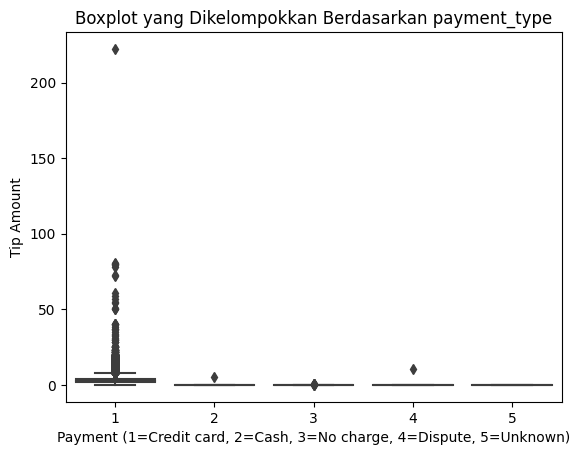

In [103]:
## Mengecek hubungan antara tip dan payment_type
ax = plt.subplot()
sns.boxplot(data=df, y='tip_amount', x='payment_type', ax=ax)
ax.set_title('Boxplot yang Dikelompokkan Berdasarkan payment_type')
ax.set_ylabel('Tip Amount')
ax.set_xlabel('Payment (1=Credit card, 2=Cash, 3=No charge, 4=Dispute, 5=Unknown)')


In [104]:
# Membuat kolom baru tip_percentage
df['tip_percentage'] = (df['tip_amount'] / df['total_amount']) * 100

In [105]:
df_tip = df[df['payment_type'] == 1]
df_tip

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,payment_type,trip_type,congestion_surcharge,year,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,...,1,1,2.75,2023,661,14.051437,Sunday,0,0,16.666667
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.70,...,1,1,0.00,2023,406,16.049261,Sunday,0,0,16.666667
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.20,...,1,1,0.00,2023,380,0.000000,Sunday,0,0,16.666667
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.50,...,1,1,0.00,2023,349,13.409742,Sunday,0,0,16.666667
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.00,...,1,1,0.00,2023,358,11.061453,Sunday,0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68205,2,2023-01-31 21:56:00,2023-01-31 22:14:00,N,1,75,186,1,3.92,20.72,...,1,1,0.00,2023,1080,13.066667,Tuesday,21,22,4.996003
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1,10,205,1,2.14,4.41,...,1,1,0.00,2023,480,16.050000,Tuesday,22,22,0.000000
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,1,66,37,1,3.44,16.53,...,1,1,0.00,2023,960,12.900000,Tuesday,23,0,16.682510
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,1,225,189,1,3.03,14.98,...,1,1,0.00,2023,1080,10.100000,Tuesday,23,23,16.684046


In [106]:
# Tampilkan deskripsi dari tip_percentage
print('Deskripsi tip_percentage (%):')
print(df_tip['tip_percentage'].describe())

# Cek ada berapa jumlah perjalanan yang tidak memberikan tip
print('Jumlah perjalanan dengan tanpa tip: ', df_tip[df_tip['tip_percentage']==0].shape[0])

# Membuat variabel baru persentase_tip_kosong
persentase_tip_kosong = df_tip[df_tip['tip_percentage'] == 0].shape[0] / df_tip.shape[0] * 100

print('Persentase perjalanan tanpa tip:', round(persentase_tip_kosong, 2), '%')

Deskripsi tip_percentage (%):
count    43549.000000
mean        13.627764
std          7.319915
min          0.000000
25%          9.110080
50%         16.666667
75%         16.666667
max         95.488140
Name: tip_percentage, dtype: float64
Jumlah perjalanan dengan tanpa tip:  5253
Persentase perjalanan tanpa tip: 12.06 %


Text(0.5, 0.98, '4 Grafik Boxplot')

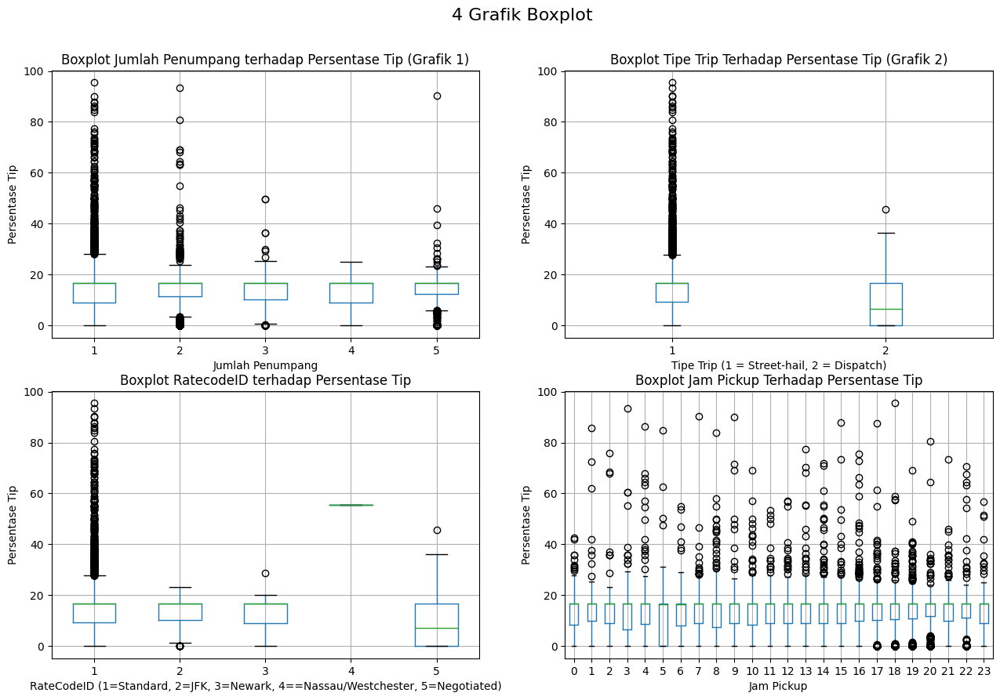

In [107]:
## More exploration about the relation between features and target
fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(15,10))


df_tip.boxplot('tip_percentage','passenger_count', ax=ax1)
ax1.set_title('Boxplot Jumlah Penumpang terhadap Persentase Tip (Grafik 1)')
ax1.set_ylabel('Persentase Tip')
ax1.set_xlabel('Jumlah Penumpang')

df_tip.boxplot('tip_percentage','trip_type', ax=ax2)
ax2.set_title('Boxplot Tipe Trip Terhadap Persentase Tip (Grafik 2)')
ax2.set_ylabel('Persentase Tip')
ax2.set_xlabel('Tipe Trip (1 = Street-hail, 2 = Dispatch)')

df_tip.boxplot('tip_percentage','RatecodeID', ax=ax3)
ax3.set_title('Boxplot RatecodeID terhadap Persentase Tip')
ax3.set_ylabel('Persentase Tip')
ax3.set_xlabel('RateCodeID (1=Standard, 2=JFK, 3=Newark, 4==Nassau/Westchester, 5=Negotiated)')

df_tip.boxplot('tip_percentage','pickup_hour', ax=ax4)
ax4.set_title('Boxplot Jam Pickup Terhadap Persentase Tip')
ax4.set_ylabel('Persentase Tip')
ax4.set_xlabel('Jam Pickup')

fig.suptitle('4 Grafik Boxplot', fontsize=16)

### Insight

Berikut insight dari 4 grafik boxplot di atas:
1. Grafik 1
    Distribusi persentase tip terlihat paling banyak di jumlah penumpang 1 dan terus berkurang seiring dengan bertambahnya jumlah penumpang.

2. Grafik 2
    Perjalanan street-hail (diambil dari jalan) memiliki persentase tip yang jauh lebih tinggi dibandingkan dengan perjalanan dispatch (dijalankan/dispatched).

3. Grafik 3
    Distribusi persentase tip terlihat paling banyak di RatecodeID 1 (Tarif Standar).

4. Grafik 4
    Jam Pickup memengaruhi persentase tip.

## Berdasarkan `perilaku penumpang` dalam memberikan tip

In [108]:
# Buat tabel pivot untuk rata-rata tip_amount per hari dan jam
tip_pivot = df_tip.pivot_table(index='pickup_day', columns='pickup_hour', values='tip_percentage', aggfunc='mean')
tip_pivot # Harinya tidak berurutan

# Buat urutan hari
order_day = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
tip_pivot = tip_pivot.reindex(order_day)
tip_pivot

pickup_hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
pickup_day,,,,,,,,,,,,,,,,,,,,,
Monday,13.838156,13.502643,15.188334,9.667685,11.821974,11.653990,13.888170,13.029475,13.103956,14.092186,...,13.638570,13.086590,14.737387,13.236277,13.638159,14.000887,13.939955,13.075988,13.097170,12.582256
Tuesday,11.182516,15.745715,15.513140,11.704059,8.365290,10.944297,11.889504,13.024683,13.271073,13.160200,...,13.774566,13.514756,13.271499,13.803408,13.768725,14.206212,14.471224,14.593166,15.813676,14.354211
Wednesday,12.488287,11.642516,11.898762,8.906860,14.979091,9.894499,12.790206,13.216959,12.680557,13.463578,...,13.376935,13.940640,13.492688,13.854288,13.755305,14.049835,14.104435,15.689765,13.714899,13.069420
Thursday,11.274732,13.588597,14.338561,11.692309,15.036031,11.086900,13.285477,12.962086,12.294194,13.279351,...,13.629906,13.204170,13.723812,13.547826,13.559098,14.003301,14.699451,13.289102,13.822592,13.546778
Friday,13.342776,15.147654,12.453244,12.775420,15.678965,11.767738,11.782264,13.225228,12.705837,12.341345,...,12.715958,12.730516,13.036367,13.659821,13.969978,13.948590,14.631125,13.779475,14.255607,14.205297
Saturday,14.091927,13.495200,14.526781,14.962248,17.229868,14.182950,9.648398,14.943982,13.856206,12.535055,...,14.406726,13.906488,14.459985,14.663520,14.540214,13.960591,13.904774,13.827320,14.414320,13.591454
Sunday,13.182615,14.295465,14.160890,13.778828,14.918505,14.193741,12.978873,11.235290,11.545805,12.709226,...,13.975515,14.162476,14.549529,14.716631,14.519533,15.055036,14.547108,14.766838,15.334651,13.272448


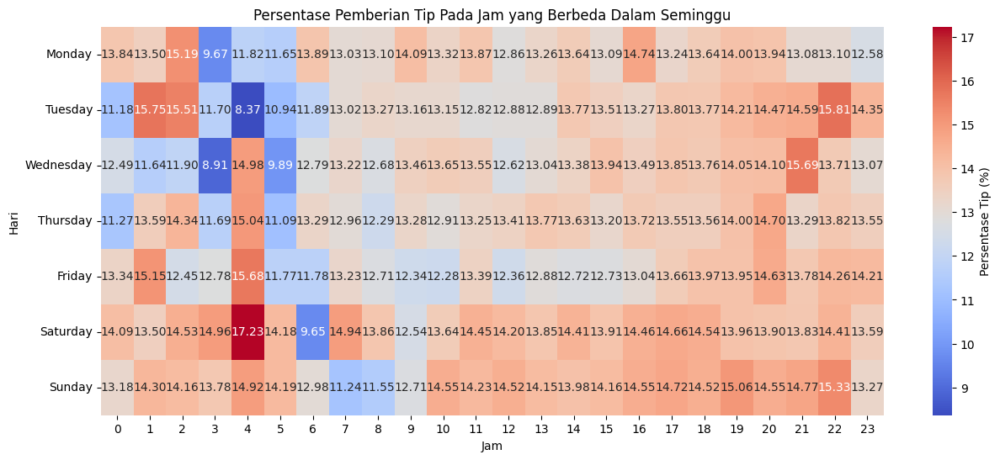

In [109]:
# Buat heatmap
plt.figure(figsize=(15, 6))
sns.heatmap(tip_pivot, 
            cmap=sns.color_palette("coolwarm", as_cmap=True), 
            annot=True, fmt=".2f", 
            cbar_kws={'label': 'Persentase Tip (%)'})

plt.title('Persentase Pemberian Tip Pada Jam yang Berbeda Dalam Seminggu')
plt.xlabel('Jam')
plt.ylabel('Hari')

plt.show()

### Insight

Dari grafik heatmap di atas, dapat dilihat bahwa penumpang tampaknya memberikan persentase yang lebih kecil dari jumlah total tarif di pagi hari pada weekday, khususnya dari jam 3 pagi hingga jam 5 pagi. Tapi, seiring dengan berjalannya waktu, persentase tip rata-rata terus meningkat. Pada weekday, terdapat sedikit penurunan di jam 12 siang, kemudian persentase tip cenderung mengalami peningkatan pada jam 1 siang dan jam seterusnya hingga malam. Namun pada weekend, penurunannya ada di jam 6 pagi hingga 8 pagi. Untuk puncaknya di weekday, terdapat pada jam 10 malam. Sedangkan untuk weekend, puncaknya ada di jam 4 pagi.

## Mengecek Korelasi Antar Atribut

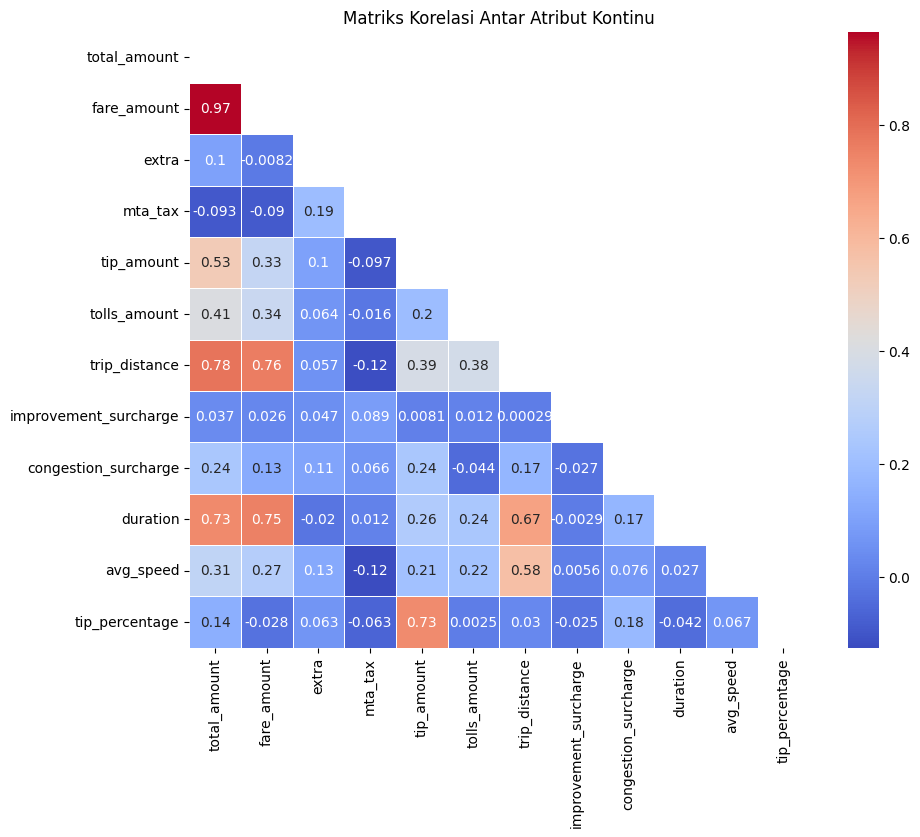

In [110]:
variabel_numerikal_continue = ['total_amount', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount',  'trip_distance', 'improvement_surcharge', 'congestion_surcharge', 'duration', 'avg_speed', 'tip_percentage']

# Buat matriks korelasi
correlation_matrix = df[variabel_numerikal_continue].corr()

# Plot matriks korelasi menggunakan heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, 
            annot=True, 
            cmap='coolwarm', 
            linewidths=.5,
            mask=np.triu(np.ones_like(correlation_matrix, dtype=bool)))
plt.title('Matriks Korelasi Antar Atribut Kontinu')
plt.show()

### Insight

Dari matriks korelasi antar atribut kontinu, dapat diambil kesimpulan sbb:
- `total_amount` memiliki korelasi yang kuat terhadap `fare_amount`, `trip_distance`, dan `duration`. Berati semakin tinggi nilai `fare_amount`, `trip_distance`, dan `duration`, maka akan semakin tinggi juga nilai `total_amount`.
- Sama seperti `total_amount`, `fare_amount` juga memiliki korelasi yang kuat terhadap `trip_distance`, dan `duration`. Semakin tinggi nilai `trip_distance` dan `duration`, maka semakin tinggi juga nilai `fare_amount`.
- `tip_amount` memiliki korelasi yang kuat dengan `tip_percentage`, nilai `tip_percentage` akan naik juga seiring dengan naiknya `tip_amount`.

## Berdasarkan `Zona`

In [111]:
# Import tabel zone & LocationID
df_zone = pd.read_csv('zona & location id taxi.csv')
df_zone.head()

,zone,LocationID
0,Newark Airport,1
1,Jamaica Bay,2
2,Allerton/Pelham Gardens,3
3,Alphabet City,4
4,Arden Heights,5


In [112]:
# Merge df & df_zone untuk mendapatkan PULocationName
df = pd.merge(left=df, right=df_zone, how='left', left_on='PULocationID', right_on='LocationID').rename(columns={'zone':'PULocationName'})
df.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,congestion_surcharge,year,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,LocationID
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.9,...,2.75,2023,661,14.051437,Sunday,0,0,16.666667,Morningside Heights,166.0
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.7,...,0.00,2023,406,16.049261,Sunday,0,0,16.666667,Bloomingdale,24.0
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.2,...,0.00,2023,380,0.000000,Sunday,0,0,16.666667,Steinway,223.0
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.5,...,0.00,2023,349,13.409742,Sunday,0,0,16.666667,Central Harlem,41.0
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.0,...,0.00,2023,358,11.061453,Sunday,0,0,0.000000,Central Harlem,41.0


In [113]:
# Merge df & df_zone untuk mendapatkan DOLocationName
df = pd.merge(left=df, right=df_zone, how='left', left_on='DOLocationID', right_on='LocationID').rename(columns={'zone':'DOLocationName'})
df.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,LocationID_x,DOLocationName,LocationID_y
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.9,...,661,14.051437,Sunday,0,0,16.666667,Morningside Heights,166.0,Lincoln Square West,143.0
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.7,...,406,16.049261,Sunday,0,0,16.666667,Bloomingdale,24.0,Central Park,43.0
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.2,...,380,0.000000,Sunday,0,0,16.666667,Steinway,223.0,Old Astoria,179.0
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.5,...,349,13.409742,Sunday,0,0,16.666667,Central Harlem,41.0,Upper West Side North,238.0
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.0,...,358,11.061453,Sunday,0,0,0.000000,Central Harlem,41.0,East Harlem North,74.0


In [114]:
# Menghapus kolom LocationID_x & LocationID_Y
df = df.drop(columns=['LocationID_x', 'LocationID_y'])
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,congestion_surcharge,year,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,DOLocationName
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,...,2.75,2023,661,14.051437,Sunday,0,0,16.666667,Morningside Heights,Lincoln Square West
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.70,...,0.00,2023,406,16.049261,Sunday,0,0,16.666667,Bloomingdale,Central Park
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.20,...,0.00,2023,380,0.000000,Sunday,0,0,16.666667,Steinway,Old Astoria
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.50,...,0.00,2023,349,13.409742,Sunday,0,0,16.666667,Central Harlem,Upper West Side North
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.00,...,0.00,2023,358,11.061453,Sunday,0,0,0.000000,Central Harlem,East Harlem North
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65742,2,2023-01-31 21:56:00,2023-01-31 22:14:00,N,1,75,186,1,3.92,20.72,...,0.00,2023,1080,13.066667,Tuesday,21,22,4.996003,East Harlem South,Penn Station/Madison Sq West
65743,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1,10,205,1,2.14,4.41,...,0.00,2023,480,16.050000,Tuesday,22,22,0.000000,Baisley Park,Saint Albans
65744,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,1,66,37,1,3.44,16.53,...,0.00,2023,960,12.900000,Tuesday,23,0,16.682510,DUMBO/Vinegar Hill,Bushwick South
65745,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,1,225,189,1,3.03,14.98,...,0.00,2023,1080,10.100000,Tuesday,23,23,16.684046,Stuyvesant Heights,Prospect Heights


In [115]:
# Import folium
import folium

In [116]:
# Menampilkan map New York
new_york_map = folium.Map(
    location = [40.730610, -73.935242],
    zoom_start = 11
)

new_york_map

In [117]:
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,congestion_surcharge,year,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,DOLocationName
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,...,2.75,2023,661,14.051437,Sunday,0,0,16.666667,Morningside Heights,Lincoln Square West
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1,24,43,1,1.81,10.70,...,0.00,2023,406,16.049261,Sunday,0,0,16.666667,Bloomingdale,Central Park
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1,223,179,1,0.00,7.20,...,0.00,2023,380,0.000000,Sunday,0,0,16.666667,Steinway,Old Astoria
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1,41,238,1,1.30,6.50,...,0.00,2023,349,13.409742,Sunday,0,0,16.666667,Central Harlem,Upper West Side North
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1,41,74,1,1.10,6.00,...,0.00,2023,358,11.061453,Sunday,0,0,0.000000,Central Harlem,East Harlem North
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65742,2,2023-01-31 21:56:00,2023-01-31 22:14:00,N,1,75,186,1,3.92,20.72,...,0.00,2023,1080,13.066667,Tuesday,21,22,4.996003,East Harlem South,Penn Station/Madison Sq West
65743,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1,10,205,1,2.14,4.41,...,0.00,2023,480,16.050000,Tuesday,22,22,0.000000,Baisley Park,Saint Albans
65744,2,2023-01-31 23:46:00,2023-02-01 00:02:00,N,1,66,37,1,3.44,16.53,...,0.00,2023,960,12.900000,Tuesday,23,0,16.682510,DUMBO/Vinegar Hill,Bushwick South
65745,2,2023-01-31 23:01:00,2023-01-31 23:19:00,N,1,225,189,1,3.03,14.98,...,0.00,2023,1080,10.100000,Tuesday,23,23,16.684046,Stuyvesant Heights,Prospect Heights


### Menghitung jumlah perjalanan per lokasinya dari `PULocationName` & `DOLocationName`

#### Jumlah perjalanan dari `PULocationName`

In [118]:
# Menghitung jumlah perjalanan per lokasi pickup
jumlah_perjalanan_dari_lokasi_PU_per_lokasi = df['PULocationName'].value_counts()
jumlah_perjalanan_dari_lokasi_PU_per_lokasi

PULocationName
East Harlem North                      12727
East Harlem South                       8772
Central Harlem                          3900
Morningside Heights                     3803
Forest Hills                            3779
                                       ...  
Breezy Point/Fort Tilden/Riis Beach        1
Randalls Island                            1
Garment District                           1
East Chelsea                               1
Country Club                               1
Name: count, Length: 219, dtype: int64

In [119]:
# Membuat dataframe jumlah perjalan per lokasi pickup
df_jumlah_perjalanan_dari_lokasi_PU_per_lokasi = pd.DataFrame({'lokasi': jumlah_perjalanan_dari_lokasi_PU_per_lokasi.index, 'jumlah_perjalanan': jumlah_perjalanan_dari_lokasi_PU_per_lokasi.values})
df_jumlah_perjalanan_dari_lokasi_PU_per_lokasi

,lokasi,jumlah_perjalanan
0,East Harlem North,12727
1,East Harlem South,8772
2,Central Harlem,3900
3,Morningside Heights,3803
4,Forest Hills,3779
...,...,...
214,Breezy Point/Fort Tilden/Riis Beach,1
215,Randalls Island,1
216,Garment District,1
217,East Chelsea,1


In [120]:
# Map banyaknya jumlah perjalanan berdasarkan lokasi pickup di New York
newyork_map = folium.Map(
    location = [40.730610, -73.935242],
    zoom_start = 11
)

bin_jumlah = df_jumlah_perjalanan_dari_lokasi_PU_per_lokasi['jumlah_perjalanan'].quantile([0, 0.25, 0.5, 0.75, 1])

newyork_geojson = r'NYC Taxi Zones.geojson'

chor_zone = folium.Choropleth(
    geo_data = newyork_geojson,          # file geojson (data geospatial)
    data = df_jumlah_perjalanan_dari_lokasi_PU_per_lokasi,                 # dataframe pandas
    columns = ['lokasi', 'jumlah_perjalanan'],   # kolom dataframe yang dipakai
    key_on = 'feature.properties.zone',   # indexing nama kelurahan di dalam file geojson untuk dijoin dengan dataframe pandas
    legend_name='Jumlah Perjalanan',      # nama untuk legend
    fill_color='Spectral',                 # mengatur warna, (merah: paling sedikit, hijau: sedang, biru: paling banyak)
    fill_opacity=0.7,                   # mengatur transparansi
    bins=bin_jumlah                     # untuk mengontrol jumlah interval yang akan digunakan dalam plot
)

chor_zone.add_to(newyork_map)
newyork_map

#### Jumlah perjalanan dari `DOLocationName`

In [121]:
# Menghitung jumlah perjalanan per lokasi dropoff
jumlah_perjalanan_dari_lokasi_DO_per_lokasi = df['DOLocationName'].value_counts()
jumlah_perjalanan_dari_lokasi_DO_per_lokasi

DOLocationName
East Harlem South         3378
East Harlem North         3263
Upper East Side North     2684
Central Harlem            2526
Upper West Side North     2283
                          ... 
Pelham Bay Park              1
Mariners Harbor              1
Green-Wood Cemetery          1
Port Richmond                1
Charleston/Tottenville       1
Name: count, Length: 245, dtype: int64

In [122]:
# Membuat dataframe jumlah perjalan per lokasi dropoff
df_jumlah_perjalanan_dari_lokasi_DO_per_lokasi = pd.DataFrame({'lokasi': jumlah_perjalanan_dari_lokasi_DO_per_lokasi.index, 'jumlah_perjalanan': jumlah_perjalanan_dari_lokasi_DO_per_lokasi.values})
df_jumlah_perjalanan_dari_lokasi_DO_per_lokasi

,lokasi,jumlah_perjalanan
0,East Harlem South,3378
1,East Harlem North,3263
2,Upper East Side North,2684
3,Central Harlem,2526
4,Upper West Side North,2283
...,...,...
240,Pelham Bay Park,1
241,Mariners Harbor,1
242,Green-Wood Cemetery,1
243,Port Richmond,1


In [123]:
# Map banyaknya jumlah perjalanan berdasarkan lokasi dropoff di New York
newyork_map = folium.Map(
    location = [40.730610, -73.935242],
    zoom_start = 11
)

bin_jumlah = df_jumlah_perjalanan_dari_lokasi_DO_per_lokasi['jumlah_perjalanan'].quantile([0, 0.25, 0.5, 0.75, 1])

newyork_geojson = r'NYC Taxi Zones.geojson'

chor_zone = folium.Choropleth(
    geo_data = newyork_geojson,          # file geojson (data geospatial)
    data = df_jumlah_perjalanan_dari_lokasi_DO_per_lokasi,                 # dataframe pandas
    columns = ['lokasi', 'jumlah_perjalanan'],   # kolom dataframe yang dipakai
    key_on = 'feature.properties.zone',   # indexing nama kelurahan di dalam file geojson untuk dijoin dengan dataframe pandas
    legend_name='Jumlah Perjalanan',      # nama untuk legend
    fill_color='Spectral',                 # mengatur warna, (merah: paling sedikit, hijau: sedang, biru: paling banyak)
    fill_opacity=0.7,                   # mengatur transparansi
    bins=bin_jumlah                     # untuk mengontrol jumlah interval yang akan digunakan dalam plot
)

chor_zone.add_to(newyork_map)
newyork_map

#### Insight

Dari grafik di atas dapat dilihat bahwa jumlah perjalanan dari lokasi penjemputan paling banyak ada di East Harlem North, East Harlem South, Central Harlem, Morningside Heights, dan 4Forest Hills. Sedangkan, lokasi penurunan paling banyak di East Harlem South, East Harlem North, Upper East Side North, Central Harlem, Upper West Side North. Hal ini berbanding lurus dengan biaya hidup di Harlem yang biayanya 25% lebih rendah dibandingkan dengan biaya hidup di kota secara keseluruhan. Tingginya tingkat penjemputan dan penurunan di lokasi ini mungkin dikarenakan banyaknya populasi di daerah tersebut.

### Menghitung tip rata-rata per perjalanan berdasarkan `PULocationName` & `DOLocationName`

#### Tip rata-rata perjalanan dari `PULocationName`

In [124]:
# Menghitung rata-rata tip per PULocationName
df_average_tip_per_PULocationName = df.groupby('PULocationName')['tip_amount'].mean().reset_index().rename(columns={'PULocationName':'pickup_location','tip_amount':'PU_avg_tip'})
df_average_tip_per_PULocationName.sort_values(by ='PU_avg_tip', ascending=False)

,pickup_location,PU_avg_tip
113,Lenox Hill West,25.880000
187,Times Sq/Theatre District,12.033333
186,Sutton Place/Turtle Bay North,9.116667
195,Upper West Side South,9.062857
184,Sunset Park East,8.950000
...,...,...
191,Union Sq,0.000000
112,Lenox Hill East,0.000000
91,Hammels/Arverne,0.000000
196,Van Cortlandt Park,0.000000


In [125]:
# Merge df & df_average_tip_per_PULocationName untuk mendapatkan PU_avg_tip
df = pd.merge(left=df, right=df_average_tip_per_PULocationName, left_on='PULocationName', right_on='pickup_location')
df.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,DOLocationName,pickup_location,PU_avg_tip
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.9,...,661,14.051437,Sunday,0,0,16.666667,Morningside Heights,Lincoln Square West,Morningside Heights,2.658207
1,2,2023-01-01 00:01:31,2023-01-01 00:16:02,N,1,166,244,1,2.48,16.3,...,871,10.250287,Sunday,0,0,16.666667,Morningside Heights,Washington Heights South,Morningside Heights,2.658207
2,2,2023-01-01 00:53:09,2023-01-01 01:13:35,N,1,166,250,5,9.01,37.3,...,1226,26.456770,Sunday,0,1,0.000000,Morningside Heights,Westchester Village/Unionport,Morningside Heights,2.658207
3,1,2023-01-01 01:45:19,2023-01-01 01:47:57,N,1,166,166,1,0.60,4.0,...,158,13.670886,Sunday,1,1,0.000000,Morningside Heights,Morningside Heights,Morningside Heights,2.658207
4,2,2023-01-01 01:34:07,2023-01-01 01:52:34,N,1,166,229,2,5.13,25.4,...,1107,16.682927,Sunday,1,1,19.994779,Morningside Heights,Sutton Place/Turtle Bay North,Morningside Heights,2.658207


In [126]:
# Menghitung rata-rata tip per PULocationName yang payment_type = 1
df_average_tip_per_PULocationName = df[df['payment_type'] == 1].groupby(['PULocationName'])['tip_amount'].mean().reset_index().rename(columns={'PULocationName':'pickup_location','tip_amount':'PU_avg_tip'})
df_average_tip_per_PULocationName.sort_values(by ='PU_avg_tip', ascending=False)

,pickup_location,PU_avg_tip
112,Lenox Hill West,25.880000
185,Times Sq/Theatre District,12.033333
77,Flushing Meadows-Corona Park,10.006667
182,Sunset Park East,9.527419
83,Glendale,9.410000
...,...,...
113,Lincoln Square West,0.000000
111,Lenox Hill East,0.000000
90,Hammels/Arverne,0.000000
194,Van Cortlandt Park,0.000000


In [127]:
# Menghapus kolom pickup_locatioN
df = df.drop(columns='pickup_location')
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,year,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,DOLocationName,PU_avg_tip
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,...,2023,661,14.051437,Sunday,0,0,16.666667,Morningside Heights,Lincoln Square West,2.658207
1,2,2023-01-01 00:01:31,2023-01-01 00:16:02,N,1,166,244,1,2.48,16.30,...,2023,871,10.250287,Sunday,0,0,16.666667,Morningside Heights,Washington Heights South,2.658207
2,2,2023-01-01 00:53:09,2023-01-01 01:13:35,N,1,166,250,5,9.01,37.30,...,2023,1226,26.456770,Sunday,0,1,0.000000,Morningside Heights,Westchester Village/Unionport,2.658207
3,1,2023-01-01 01:45:19,2023-01-01 01:47:57,N,1,166,166,1,0.60,4.00,...,2023,158,13.670886,Sunday,1,1,0.000000,Morningside Heights,Morningside Heights,2.658207
4,2,2023-01-01 01:34:07,2023-01-01 01:52:34,N,1,166,229,2,5.13,25.40,...,2023,1107,16.682927,Sunday,1,1,19.994779,Morningside Heights,Sutton Place/Turtle Bay North,2.658207
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65740,1,2023-01-30 15:53:15,2023-01-30 16:23:59,N,1,64,215,1,0.00,24.20,...,2023,1844,0.000000,Monday,15,16,0.000000,Douglaston,South Jamaica,0.000000
65741,2,2023-01-01 01:58:00,2023-01-01 02:24:00,N,1,158,236,1,0.00,44.06,...,2023,1560,0.000000,Sunday,1,2,0.000000,Meatpacking/West Village West,Upper East Side North,0.000000
65742,2,2023-01-02 16:25:00,2023-01-02 17:18:00,N,1,141,1,1,0.00,108.39,...,2023,3180,0.000000,Monday,16,17,16.667740,Lenox Hill West,Newark Airport,25.880000
65743,1,2023-01-03 09:27:55,2023-01-03 09:28:12,N,1,164,164,1,0.00,30.36,...,2023,17,0.000000,Tuesday,9,9,0.000000,Midtown South,Midtown South,0.000000


In [128]:
# Map tip rata-rata berdasarkan lokasi pickup di New York
newyork_map = folium.Map(
    location = [40.730610, -73.935242],
    zoom_start = 11
)

bin_jumlah = df_average_tip_per_PULocationName['PU_avg_tip'].quantile([0, 0.25, 0.5, 0.75, 1])

newyork_geojson = r'NYC Taxi Zones.geojson'

chor_zone = folium.Choropleth(
    geo_data = newyork_geojson,          # file geojson (data geospatial)
    data = df_average_tip_per_PULocationName,                 # dataframe pandas
    columns = ['pickup_location', 'PU_avg_tip'],   # kolom dataframe yang dipakai
    key_on = 'feature.properties.zone',   # indexing nama kelurahan di dalam file geojson untuk dijoin dengan dataframe pandas
    legend_name='Tip Rata-Rata',      # nama untuk legend
    fill_color='Spectral',                 # mengatur warna, (merah: paling sedikit, hijau: sedang, biru: paling banyak)
    fill_opacity=0.7,                   # mengatur transparansi
    bins=bin_jumlah                     # untuk mengontrol jumlah interval yang akan digunakan dalam plot
)

chor_zone.add_to(newyork_map)
newyork_map

#### Tip rata-rata perjalanan dari `DOLocationName`

In [129]:
# Menghitung rata-rata tip per DOLocationName
df_average_tip_per_DOLocationName = df.groupby('DOLocationName')['tip_amount'].mean().reset_index().rename(columns={'DOLocationName':'dropoff_location','tip_amount':'DO_avg_tip'})
df_average_tip_per_DOLocationName.sort_values(by ='DO_avg_tip', ascending=False)

,dropoff_location,DO_avg_tip
22,Breezy Point/Fort Tilden/Riis Beach,14.050000
157,Newark Airport,13.964583
113,JFK Airport,7.489277
7,Battery Park,7.460000
117,Kensington,7.379211
...,...,...
156,New Dorp/Midland Beach,0.000000
203,Stapleton,0.000000
196,South Beach/Dongan Hills,0.000000
171,Port Richmond,0.000000


In [130]:
# Merge df & df_average_tip_per_DOLocationName untuk mendapatkan DO_avg_tip
df = pd.merge(left=df, right=df_average_tip_per_DOLocationName, left_on='DOLocationName', right_on='dropoff_location')
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,DOLocationName,PU_avg_tip,dropoff_location,DO_avg_tip
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,...,14.051437,Sunday,0,0,16.666667,Morningside Heights,Lincoln Square West,2.658207,Lincoln Square West,3.361379
1,2,2023-01-02 18:56:58,2023-01-02 19:14:50,N,1,166,143,1,3.16,19.80,...,10.611940,Monday,18,19,0.000000,Morningside Heights,Lincoln Square West,2.658207,Lincoln Square West,3.361379
2,2,2023-01-03 15:28:11,2023-01-03 15:47:47,N,1,166,143,1,2.55,19.10,...,7.806122,Tuesday,15,15,16.666667,Morningside Heights,Lincoln Square West,2.658207,Lincoln Square West,3.361379
3,2,2023-01-03 17:37:14,2023-01-03 17:51:35,N,1,166,143,1,1.96,15.60,...,8.195122,Tuesday,17,17,0.000000,Morningside Heights,Lincoln Square West,2.658207,Lincoln Square West,3.361379
4,1,2023-01-03 19:03:53,2023-01-03 19:17:50,N,1,166,143,2,2.10,13.50,...,9.032258,Tuesday,19,19,0.000000,Morningside Heights,Lincoln Square West,2.658207,Lincoln Square West,3.361379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65727,2,2023-01-11 17:18:54,2023-01-11 17:23:38,N,1,206,206,1,0.99,7.20,...,12.549296,Wednesday,17,17,0.000000,Saint George/New Brighton,Saint George/New Brighton,0.400000,Saint George/New Brighton,0.000000
65728,2,2023-01-13 18:54:31,2023-01-13 19:14:38,N,1,206,187,1,5.52,25.40,...,16.463960,Friday,18,19,0.000000,Saint George/New Brighton,Port Richmond,0.400000,Port Richmond,0.000000
65729,2,2023-01-18 14:37:37,2023-01-18 14:59:56,N,1,206,156,1,5.10,26.10,...,13.711725,Wednesday,14,14,6.756757,Saint George/New Brighton,Mariners Harbor,0.400000,Mariners Harbor,2.000000
65730,2,2023-01-19 14:43:16,2023-01-19 14:43:27,N,5,23,23,1,0.00,109.25,...,0.000000,Thursday,14,14,0.000000,Bloomfield/Emerson Hill,Bloomfield/Emerson Hill,1.250000,Bloomfield/Emerson Hill,0.000000


In [131]:
# Menghitung rata-rata tip per DOLocationName yang payment_type = 1
df_average_tip_per_DOLocationName = df[df['payment_type'] == 1].groupby(['DOLocationName'])['tip_amount'].mean().reset_index().rename(columns={'DOLocationName':'dropoff_location','tip_amount':'DO_avg_tip'})
df_average_tip_per_DOLocationName

,dropoff_location,DO_avg_tip
0,Allerton/Pelham Gardens,2.337143
1,Alphabet City,5.241250
2,Astoria,2.815453
3,Astoria Park,2.040000
4,Auburndale,4.325882
...,...,...
239,Woodlawn/Wakefield,1.386000
240,Woodside,2.336853
241,World Trade Center,3.866000
242,Yorkville East,3.601536


In [132]:
# Menghapus kolom dropoff_location
df = df.drop(columns='dropoff_location')
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,duration,avg_speed,pickup_day,pickup_hour,dropoff_hour,tip_percentage,PULocationName,DOLocationName,PU_avg_tip,DO_avg_tip
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1,166,143,1,2.58,14.90,...,661,14.051437,Sunday,0,0,16.666667,Morningside Heights,Lincoln Square West,2.658207,3.361379
1,2,2023-01-02 18:56:58,2023-01-02 19:14:50,N,1,166,143,1,3.16,19.80,...,1072,10.611940,Monday,18,19,0.000000,Morningside Heights,Lincoln Square West,2.658207,3.361379
2,2,2023-01-03 15:28:11,2023-01-03 15:47:47,N,1,166,143,1,2.55,19.10,...,1176,7.806122,Tuesday,15,15,16.666667,Morningside Heights,Lincoln Square West,2.658207,3.361379
3,2,2023-01-03 17:37:14,2023-01-03 17:51:35,N,1,166,143,1,1.96,15.60,...,861,8.195122,Tuesday,17,17,0.000000,Morningside Heights,Lincoln Square West,2.658207,3.361379
4,1,2023-01-03 19:03:53,2023-01-03 19:17:50,N,1,166,143,2,2.10,13.50,...,837,9.032258,Tuesday,19,19,0.000000,Morningside Heights,Lincoln Square West,2.658207,3.361379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65727,2,2023-01-11 17:18:54,2023-01-11 17:23:38,N,1,206,206,1,0.99,7.20,...,284,12.549296,Wednesday,17,17,0.000000,Saint George/New Brighton,Saint George/New Brighton,0.400000,0.000000
65728,2,2023-01-13 18:54:31,2023-01-13 19:14:38,N,1,206,187,1,5.52,25.40,...,1207,16.463960,Friday,18,19,0.000000,Saint George/New Brighton,Port Richmond,0.400000,0.000000
65729,2,2023-01-18 14:37:37,2023-01-18 14:59:56,N,1,206,156,1,5.10,26.10,...,1339,13.711725,Wednesday,14,14,6.756757,Saint George/New Brighton,Mariners Harbor,0.400000,2.000000
65730,2,2023-01-19 14:43:16,2023-01-19 14:43:27,N,5,23,23,1,0.00,109.25,...,11,0.000000,Thursday,14,14,0.000000,Bloomfield/Emerson Hill,Bloomfield/Emerson Hill,1.250000,0.000000


In [133]:
# Map tip rata-rata berdasarkan lokasi dropoff di New York
newyork_map = folium.Map(
    location = [40.730610, -73.935242],
    zoom_start = 11
)

bin_jumlah = df_average_tip_per_DOLocationName['DO_avg_tip'].quantile([0, 0.25, 0.5, 0.75, 1])

newyork_geojson = r'NYC Taxi Zones.geojson'

chor_zone = folium.Choropleth(
    geo_data = newyork_geojson,          # file geojson (data geospatial)
    data = df_average_tip_per_DOLocationName,                 # dataframe pandas
    columns = ['dropoff_location', 'DO_avg_tip'],   # kolom dataframe yang dipakai
    key_on = 'feature.properties.zone',   # indexing nama kelurahan di dalam file geojson untuk dijoin dengan dataframe pandas
    legend_name='Tip Rata-Rata',      # nama untuk legend
    fill_color='Spectral',                 # mengatur warna, (merah: paling sedikit, hijau: sedang, biru: paling banyak)
    fill_opacity=0.7,                   # mengatur transparansi
    bins=bin_jumlah                     # untuk mengontrol jumlah interval yang akan digunakan dalam plot
)

chor_zone.add_to(newyork_map)
newyork_map

#### Insight
Grafik di atas menggambarkan bahwa penumpang yang dijemput dari Lenox Hill West, Times Sq/Theatre District, Flushing Meadows-Corona Park, Sunset Park East, dan Glendale cenderung memberikan tip yang lebih besar. Sebaliknya, tip yang lebih besar diberikan oleh penumpang yang turun di Breezy Point/Fort Tilden/Riis Beach, Newark Airport, JFK Airport, Battery Park, dan Kensington.

# Kesimpulan dan Rekomendasi

**Kesimpulan**

Dari keseluruhan analisis yang telah dilakukan, berikut adalah kesimpulan yang dapat diambil tentang karakteristik New York City:
Data awal terdiri dari 68.211 baris data dengan 20 kolom. Setelah melalui proses data cleaning dan penambahan kolom, akhirnya dataset ini menjadi terdiri dari 65747 baris dan 30 kolom.

- Berdasarkan `trip_distance`:
1. Karakteristik Penumpang Terhadap Jarak

    Warga di New York cenderung lebih sering menggunakan taxi sebagai opsi utama apabila jarak tempuhnya pendek ±1-2 miles. Hal ini mungkin disebabkan apabila jaraknya jauh, warga di New York lebih memilih menggunakan alternatif lain contohnya seperti menggunakan bus atau kereta.

2. Karakteristik Penumpang Terhadap Jarak dan Jam per Harinya pada Weekday dan Weekend
    - Warga New York cenderung melakukan perjalanan yang jaraknya jauh di pagi hari pukul 4am - 6am di saat warga hendak bekerja.
    - Untuk perjalanan jarak pendek dan sedang cenderung terjadi di rentang pukul 6am - 4am. Puncak perjalan jarak yang ssedang biasanya terjadi di pukul 11am saat menuju jam makan siang.

- Berdasarkan `income` terhadap `RatecodeID`:
    - Top 3 Rata-rata `total_amount` ada di perjalanan ke Bandara JFK & Newark diikuti dengan perjalanan keluar New York City. Faktor yang paling memengaruhi `total_amount` untuk perjalanan ke bandara secara berurutan adalah `fare_amount`, `tip_amount`, dan `tolls_amount`.
<br><br>
- Berdasarkan `passenger_count` terhadap `tip_amount`:
    - Jumlah Penumpang yang terdiri dari 1 hingga 3 orang tidak memiliki perbedaan yang signifikan dalam memberikan tip. Sedangkan penumpang yang terdiri dari 4 hingga 5 orang cenderung lebih dermawan dalam memberikan tip yang besar.
<br><br>
- Berdasarkan `congestion_surcharge` & `tip_amount` terhadap `total_amount`:
    - Biaya tambahan `congestion_surcharge` hanya memberikan kontribusi kecil terhadap total biaya perjalanan dalam sehari.
    - Penumpang cenderung memberi tip lebih besar sebagai persentase dari `total_amount` perjalanan mereka pada sore hari menuju malam.
<br><br>
- Berdasarkan `trip_type` terhadap `tip_percentage`:
    - Perjalanan street-hail (diambil dari jalan) memiliki `tip_percentage` (persentase tip) yang jauh lebih tinggi dibandingkan dengan perjalanan dispatch (dijalankan/dispatched).
<br><br>
- Berdasarkan perilaku penumpang dalam memberikan tip:
    - Persentase tip yang diberikan oleh penumpang ternyata dipengaruhi oleh jam di hari weekday dan weekend. Persentase tip di weekday berpuncak jam 10 malam, tapi dari rentang jam 7 malam hingga 10 malam persentase tip yang diberikan juga cukup besar. Namun untuk weekend, puncaknya ada di jam 4 pagi dan dari rentang jam 10 pagi hingga 10 malam persentase tipnya moderat.
<br><br>
- Korelasi antar atribut
    - `total_amount` memiliki korelasi yang kuat terhadap `fare_amount`, `trip_distance`, dan `duration`. Berati semakin tinggi nilai `fare_amount`, `trip_distance`, dan `duration`, maka akan semakin tinggi juga nilai `total_amount`. `fare_amount` juga memiliki korelasi positif dengan `trip_distance` dan `duration`.
<br><br>
- Berdasarkan zona, dibagi menjadi 2:
    1. Jumlah perjalanan terhadap PULocationName dan DOLocationName
        Jumlah perjalanan dari lokasi penjemputan paling banyak ada di East Harlem North, East Harlem South, Central Harlem, Morningside Heights, dan 4Forest Hills. Sedangkan, lokasi penurunan paling banyak di East Harlem South, East Harlem North, Upper East Side North, Central Harlem, Upper West Side North. Hal ini berbanding lurus dengan biaya hidup di Harlem yang biayanya 25% lebih rendah dibandingkan dengan biaya hidup di kota secara keseluruhan. Tingginya tingkat penjemputan dan penurunan di lokasi ini mungkin dikarenakan banyaknya populasi di daerah tersebut.
        
    2. Tip rata-rata perjalanan terhadap PULocationName dan DOLocationName
        Penumpang yang dijemput dari Lenox Hill West, Times Sq/Theatre District, Flushing Meadows-Corona Park, Sunset Park East, dan Glendale cenderung memberikan tip yang lebih besar. Sebaliknya, tip yang lebih besar diberikan oleh penumpang yang turun di Breezy Point/Fort Tilden/Riis Beach, Newark Airport, JFK Airport, Battery Park, dan Kensington.Zona asal dan tujuan dapat memengaruhi besar tip. Beberapa zona mungkin lebih ramai dan padat, sehingga pengemudi mungkin mengalami kesulitan dalam perjalanan. Zona-zona ini mungkin termasuk Lenox Hill West dan Times Sq/Theatre District. Sebaliknya, tujuan seperti Newark Airport atau JFK Airport mungkin memiliki tarif tetap atau lebih tinggi, sehingga penumpang mungkin kurang bersedia memberikan tip tambahan.

**Rekomendasi**
1. Beberapa lokasi padat seperti di Lenox Hill West dan Times Sq/Theatre District, cenderung memberikan tip yang lebih besar, pengemudi taksi dapat mempertimbangkan untuk meningkatkan layanan dan kenyamanan di lokasi tersebut. Hal ini dapat mencakup peningkatan kebersihan kendaraan, pelayanan yang ramah, dan penanganan lalu lintas yang lebih baik.

2. Metode pembayaran paling banyak adalah pembayaran menggunakan kartu kredit, dan cenderung memberikaan tip yang lebih besar. Pengemudi taksi dapat sekalian mempromosikan penggunaan  kartu kredit sebagai metode untuk mendorong pendapatan tip yang lebih besar. 

3. Di analisis ini, kita dapat melihat bahwa persentase tip cenderung meningkat pada jam-jam tertentu dalam sehari, terutama di weekend. Pengemudi taksi dapat mempertimbangkan untuk aktif selama periode waktu ini untuk meningkatkan pendapatan mereka. Hal ini juga didukung dengan meningkatnya jumlah perjalanan pada jam-jam tertentu sehingga peluang pengemudi untuk mendapatkan tip yang besar bisa dikatakan cukup besar.

4. Pengemudi taksi mungkin dapat disebarkan lebih banyak di sekitaran lingkungan Harlem. Hal ini dikarenakan pada jumlah perjalanan pada lingkungan tersebut adalah yang paling banyak, maupun sebagai titik penjemputan atau titik penurunan penumpang. Ini juga berlaku untuk perjalanan yang RatecodeID nya 2, taksi juga dapat disebarkan di Bandara JFK atau Manhattan. Karena untuk perjalanan dari Bandara JFK ke Manhattan atau sebaliknya, fare amountnya sudah dipatok $70 dan ini belum termasuk biaya-biaya lain. Penumpang yang turun di Bandara Newark dan JFK juga cenderung memberikan tip rata-rata yang cukup tinggi, Mungkin ini bisa jadi salah satu pertimbangan.

Analisis data ini diharapkan dapat memberikan wawasan yang mendalam tentang dinamika transportasi perkotaan di New York City, dan hasilnya dapat digunakan untuk pengambilan keputusan yang lebih baik dalam pengelolaan sistem transportasi, penyesuaian tarif, serta perencanaan perkotaan yang lebih efisien.

In [134]:
# df.to_csv('data_capstone_2_clean.csv', index=False)